VERSIONS USED

Notebook version: 6.4.12
Seaborn version: 0.13.0
Matplotlib version: 3.5.2

In [ ]:
# let's import all the required libraries

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import colorcet as cc
from matplotlib.gridspec import GridSpec

In [7]:
# let's read the CSV file

In [8]:
crime_data = pd.read_csv('Crime_Dataset_Coursework1-1.csv', low_memory=False)

In [9]:
crime_data.head()          # display top 5 rows of dataset

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Prefix,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,MIDDLEBROOK,NaN,RD,08/23/2018 09:52:00 PM,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)"
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,03/30/2018 01:01:00 AM,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,03/30/2018 01:01:00 AM,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,NaN,QUINCE ORCHARD,NaN,RD,06/14/2018 10:26:00 PM,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,"(39.148, -77.2182)"
4,201204355,2204,180043926,09/03/18 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,NaN,FALSTONE,NaN,AVE,09/02/18 23:30,09/03/18 00:30,38.966174,-77.096561,2D,"(38.9662, -77.0966)"


In [10]:
### Let's see the information of the dataframe

In [11]:
crime_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306094 entries, 0 to 306093
Data columns (total 30 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Incident ID             306094 non-null  int64  
 1   Offence Code            306094 non-null  object 
 2   CR Number               306094 non-null  int64  
 3   Dispatch Date / Time    257065 non-null  object 
 4   NIBRS Code              306094 non-null  object 
 5   Victims                 306094 non-null  int64  
 6   Crime Name1             305822 non-null  object 
 7   Crime Name2             305822 non-null  object 
 8   Crime Name3             305822 non-null  object 
 9   Police District Name    306000 non-null  object 
 10  Block Address           279888 non-null  object 
 11  City                    304818 non-null  object 
 12  State                   306094 non-null  object 
 13  Zip Code                302915 non-null  float64
 14  Agency              

In [12]:
### With the data being intially scanned in excel, we saw that there were some spelling errors which can be rectified for the data to be clean and neat and easier to undertsand

In [13]:
crime_data1 = crime_data.copy()                    # duplicating the crime_data

In [14]:
crime_data1

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Prefix,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,MIDDLEBROOK,NaN,RD,08/23/2018 09:52:00 PM,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)"
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,03/30/2018 01:01:00 AM,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,NaN,WOODMONT,NaN,AVE,03/30/2018 01:01:00 AM,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)"
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,NaN,QUINCE ORCHARD,NaN,RD,06/14/2018 10:26:00 PM,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,"(39.148, -77.2182)"
4,201204355,2204,180043926,09/03/18 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,NaN,FALSTONE,NaN,AVE,09/02/18 23:30,09/03/18 00:30,38.966174,-77.096561,2D,"(38.9662, -77.0966)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306089,201320571,1399,210006666,02/21/2021 07:25:28 AM,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,MONTGOMERY VILLAGE,...,NaN,TRANSHIRE,NaN,RD,02/20/2021 08:00:00 PM,NaN,39.172701,-77.197340,6D,"(39.1727, -77.1973)"
306090,201329875,2305,210017101,05/06/21 22:54,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,WHEATON,...,NaN,ATHERTON,NaN,DR,05/06/21 03:15,NaN,39.059672,-77.075995,4D,"(39.0597, -77.076)"
306091,201329751,5016,210016952,05/05/21 22:38,90Z,1,Crime Against Society,All Other Offenses,OBSTRUCT GOVT - VIOLATION OF A COURT ORDER,GERMANTOWN,...,NaN,BALTUSROL,NaN,DR,05/05/21 22:38,NaN,39.199722,-77.273038,5D,"(39.1997, -77.273)"
306092,201323117,9099,210009468,03/13/2021 12:07:14 PM,90Z,1,Crime Against Society,All Other Offenses,ALL OTHER OFFENSES,SILVER SPRING,...,NaN,FENTON,NaN,ST,03/13/2021 01:35:00 PM,NaN,38.985813,-77.022915,3D,"(38.9858, -77.0229)"


In [15]:
crime_data1['City'].value_counts()                  # Getting the count values of each city in the entire dataframe

SILVER SPRING         105487
GAITHERSBURG           44598
ROCKVILLE              42492
GERMANTOWN             30066
BETHESDA               21240
                       ...  
FRIENDSHIP HEIGHTS         1
FALLS CHURCH               1
GAITHERSBUG                1
ROCKVIILE                  1
GREENBELT                  1
Name: City, Length: 66, dtype: int64

In [16]:
# There are few spelling mistakes in the city names in the dataframe, here is the dict with key as incorrect names and values as correct names.
city_mapping = {
    'BETHEDA': 'BETHESDA',
    'CLAEKSBURG': 'CLARKSBURG',
    'FREDRICK': 'FREDERICK',
    'GAIHTERSBURG': 'GAITHERSBURG',
    'GAITHERSBUG': 'GAITHERSBURG',
    'ROCKVIILE': 'ROCKVILLE',
    'ROCKVILLLE': 'ROCKVILLE',
    'SILVERS SPRING': 'SILVER SPRING',
    'TACOMA PARK': 'TAKOMA PARK',
    'MT AIRY': 'MOUNT AIRY'
}

In [17]:
crime_data1['City'].replace(city_mapping, inplace=True)         # Replaceing the wrong names with the correct names in the entire dataframe

In [18]:
crime_data1['City'].value_counts()

SILVER SPRING         105488
GAITHERSBURG           44600
ROCKVILLE              42495
GERMANTOWN             30066
BETHESDA               21242
MONTGOMERY VILLAGE      9445
TAKOMA PARK             8370
CHEVY CHASE             6410
POTOMAC                 6336
DERWOOD                 5496
KENSINGTON              4824
OLNEY                   4679
BURTONSVILLE            3776
CLARKSBURG              3248
DAMASCUS                2552
BOYDS                   1968
BROOKEVILLE              919
POOLESVILLE              897
ASHTON                   419
SANDY SPRING             392
DICKERSON                292
CABIN JOHN               227
SPENCERVILLE             149
MOUNT AIRY                92
GLEN ECHO                 91
BRINKLOW                  72
LAUREL                    49
BARNESVILLE               48
BEALLSVILLE               43
WASHINGTON                23
BELTSVILLE                19
GARRETT PARK              16
HYATTSVILLE               16
WASHINGTON GROVE           9
HIGHLAND      

In [19]:
crime_data1['City'].value_counts().count()             #get the count of number of cities

57

In [20]:
crime_data1 = crime_data1[crime_data1['City'] != '0']    # removeing the row which has city name as 0 and updateing the dataframe

In [21]:
crime_data1['City'].nunique()                     #get the count of number of cities

56

In [22]:
crime_data1['City'].unique()                    #getting the unique cities names

array(['GERMANTOWN', 'BETHESDA', 'GAITHERSBURG', 'CHEVY CHASE',
       'SILVER SPRING', 'ROCKVILLE', 'TAKOMA PARK', 'POTOMAC',
       'BURTONSVILLE', 'CLARKSBURG', 'OLNEY', 'GLEN ECHO', 'KENSINGTON',
       'BOYDS', 'ASHTON', 'MONTGOMERY VILLAGE', 'DAMASCUS', 'DERWOOD',
       'BEALLSVILLE', 'HYATTSVILLE', 'SANDY SPRING', 'DICKERSON', nan,
       'POOLESVILLE', 'WASHINGTON GROVE', 'BROOKEVILLE', 'CABIN JOHN',
       'MOUNT AIRY', 'GARRETT PARK', 'SPENCERVILLE', 'WASHINGTON',
       'BARNESVILLE', 'BRINKLOW', 'LAUREL', 'BELTSVILLE', 'WHEATON',
       'FALLS CHURCH', 'FRIENDSHIP HEIGHTS', 'COLLEGE PARK',
       'NORTH POTOMAC', 'LANHAM', 'NORTH BETHESDA', 'HIGHLAND',
       'CAPITOL HEIGHTS', 'RIVERDALE', 'MOUNT RAINIER', 'ALEXANDRIA',
       'BRENTWOOD', 'ADELPHI', 'WOODBINE', 'HAGERSTOWN', 'VIENNA',
       'WEST FRIENDSHIP', 'MCLEAN', 'FREDERICK', 'BOWIE', 'GREENBELT'],
      dtype=object)

In [23]:
crime_data1.loc[crime_data1['City'].isna()]           #checking if there is any null values in the city column

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Prefix,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location
358,201334197,2305,210022270,06/11/21 10:19,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,CITY OF TAKOMA PARK,...,NaN,NEW HAMPSHIRE,NaN,AVE,06/10/21 20:00,06/11/21 10:16,38.967333,-77.001288,8D,"(38.9673, -77.0013)"
398,201330620,2404,210017991,05/13/2021 11:08:22 AM,240,1,Crime Against Property,Motor Vehicle Theft,AUTO THEFT - VEHICLE THEFT,CITY OF TAKOMA PARK,...,NaN,NEW HAMPSHIRE,NaN,AVE,05/13/2021 10:56:00 AM,NaN,38.965699,-77.002473,8D,"(38.9657, -77.0025)"
905,201332913,2305,210020757,06/01/21 14:47,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,CITY OF TAKOMA PARK,...,NaN,NEW HAMPSHIRE,NaN,AVE,05/30/2021 11:00:00 AM,06/01/21 14:46,38.972982,-76.996832,8D,"(38.973, -76.9968)"
1559,201336265,2902,210024766,06/28/2021 12:23:12 PM,290,1,Crime Against Property,Destruction/Damage/Vandalism of Property,DAMAGE PROPERTY - PRIVATE,SILVER SPRING,...,NaN,EASTERN,NaN,AVE,06/28/2021 11:15:00 AM,06/28/2021 11:58:00 AM,38.984532,-77.026610,3D,"(38.9845, -77.0266)"
1896,201318325,2303,210004042,02/01/21 10:55,23C,1,Crime Against Property,Shoplifting,LARCENY - SHOPLIFTING,CITY OF TAKOMA PARK,...,NaN,UNIVERSITY,E,BLV,02/01/21 10:30,02/01/21 10:30,39.036569,-77.030910,8D,"(39.0366, -77.0309)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305623,201323983,5212,210000015,01/01/21 01:23,520,1,Crime Against Society,Weapon Law Violations,WEAPON - POSSESSION,CITY OF TAKOMA PARK,...,NaN,NEW HAMPSHIRE,NaN,AVE,01/01/21 01:25,01/01/21 03:00,38.971040,-76.998535,8D,"(38.971, -76.9985)"
305750,201325005,3615,210011236,03/25/2021 03:38:20 PM,90C,1,Crime Against Society,All Other Offenses,SEX OFFENSE - INDECENT EXPOSURE TO ADULT,CITY OF TAKOMA PARK,...,NaN,UNIVERSITY,E,BLV,03/24/2021 09:00:00 PM,03/24/2021 09:01:00 PM,39.035851,-77.026890,8D,"(39.0359, -77.0269)"
305803,201332129,2305,210019731,05/25/2021 12:11:07 PM,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,SILVER SPRING,...,NaN,EASTERN,NaN,AVE,05/25/2021 12:00:00 AM,05/25/2021 08:45:00 AM,38.981566,-77.022791,3D,"(38.9816, -77.0228)"
305854,201321030,2404,210007201,02/25/2021 08:50:02 AM,240,1,Crime Against Property,Motor Vehicle Theft,AUTO THEFT - VEHICLE THEFT,CITY OF TAKOMA PARK,...,NaN,NEW HAMPSHIRE,NaN,AVE,02/25/2021 07:45:00 AM,NaN,38.970719,-76.998806,8D,"(38.9707, -76.9988)"


In [24]:
crime_data1.loc[crime_data1['City'] == 'CLARKSBURG', 'State'] = 'MD'          #replacing the sate name as MD for city = CLARKSBURG

In [25]:
crime_data1['State'].unique()                  #getting the unique state names

array(['MD', 'DC', '16', 'VA', 'ND', '15', 'ME', 'MS', '0', '17'],
      dtype=object)

In [26]:
# Mapping the abbrivation with the expansion
state_mapping = {
    'MD': 'Maryland',
    'VA': 'Virginia',
    'ME': 'Maine',
    'MS': 'Mississippi',
    'ND': 'North Dakota',
    'DC': 'Washington, D.C.'
}

crime_data1['State'] = crime_data1['State'].replace(state_mapping)

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/1456719557.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data1['State'] = crime_data1['State'].replace(state_mapping)


In [27]:
crime_data1['State'].unique()               #getting the unique state names

array(['Maryland', 'Washington, D.C.', '16', 'Virginia', 'North Dakota',
       '15', 'Maine', 'Mississippi', '0', '17'], dtype=object)

In [28]:
crime_data1['State'] = np.where((crime_data1['City'] == 'SILVER SPRING') | (crime_data1['State'] == '16') | (crime_data1['State'] == '15'), 'Maryland', crime_data1['State'])            #replacing the state name as Maryland for the rows which has state name as "15" or "16" or the city name as"Silver Spring"

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/3439905036.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data1['State'] = np.where((crime_data1['City'] == 'SILVER SPRING') | (crime_data1['State'] == '16') | (crime_data1['State'] == '15'), 'Maryland', crime_data1['State'])            #replacing the state name as Maryland for the rows which has state name as "15" or "16" or the city name as"Silver Spring"


In [29]:
crime_data1['State'].unique()            #getting the unique state names after replacing

array(['Maryland', 'Washington, D.C.', 'Virginia', 'North Dakota',
       'Maine'], dtype=object)

In [30]:
# crime_data1.to_csv('Updated.csv', index=False)

In [31]:
crime_data1['Police District Number'].value_counts()       #getting the value counts of Police District Number

3D       64388
4D       57568
6D       52538
2D       42777
1D       41535
5D       39255
8D        6408
TPPD      1284
OTHER      246
8.0D        82
3.0D         6
6.0D         2
5.0D         2
1.0D         1
4.0D         1
Name: Police District Number, dtype: int64

In [32]:
#replacing the respective "*.0D" Police District Number to "*D" Police District Number
crime_data1.loc[crime_data["Police District Number"] == "8.0D", "Police District Number"] = "8D"
crime_data1.loc[crime_data["Police District Number"] == "3.0D", "Police District Number"] = "3D"
crime_data1.loc[crime_data["Police District Number"] == "6.0D", "Police District Number"] = "6D"
crime_data1.loc[crime_data["Police District Number"] == "5.0D", "Police District Number"] = "5D"
crime_data1.loc[crime_data["Police District Number"] == "1.0D", "Police District Number"] = "1D"
crime_data1.loc[crime_data["Police District Number"] == "4.0D", "Police District Number"] = "4D"

In [33]:
crime_data1['Police District Number'].value_counts()            #getting the value counts of Police District Number after replacing

3D       64394
4D       57569
6D       52540
2D       42777
1D       41536
5D       39257
8D        6490
TPPD      1284
OTHER      246
Name: Police District Number, dtype: int64

In [34]:
pd.isnull(crime_data1['Police District Name']).value_counts()    #getting the value counts of Police District Name

False    305999
True         94
Name: Police District Name, dtype: int64

In [35]:
#replacing the respective Police District Name to missing values wrt Police District Number
crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '8D', 'CITY OF TAKOMA PARK', crime_data1['Police District Name'])
crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '6D', 'MONTGOMERY VILLAGE', crime_data1['Police District Name'])
crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '5D', 'GERMANTOWN', crime_data1['Police District Name'])
crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '1D', 'ROCKVILLE', crime_data1['Police District Name'])
crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '4D', 'WHEATON', crime_data1['Police District Name'])
crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '3D', 'SILVER SPRING', crime_data1['Police District Name'])

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/1103510619.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '8D', 'CITY OF TAKOMA PARK', crime_data1['Police District Name'])
/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/1103510619.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data1['Police District Name'] = np.where(crime_data1['Police District Number'] == '6D', 'MONTGOMER

In [36]:
pd.isnull(crime_data1['Police District Name']).value_counts()        #getting the value counts of Police District Name after replacing

False    306093
Name: Police District Name, dtype: int64

In [37]:
# crime_data1.to_csv('Updated.csv', index=False)

In [38]:
# Replacing the null values of the city wrt Police District Name
crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'CITY OF TAKOMA PARK') & (crime_data1['City'].isna()), 'TAKOMA PARK', crime_data1['City'])
crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'TAKOMA PARK') & (crime_data1['City'].isna()), 'TAKOMA PARK', crime_data1['City'])
crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'SILVER SPRING') & (crime_data1['City'].isna()), 'SILVER SPRING', crime_data1['City'])
crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'MONTGOMERY VILLAGE') & (crime_data1['City'].isna()), 'GAITHERSBURG', crime_data1['City'])
crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'OTHER') & (crime_data1['City'].isna()), 'HYATTSVILLE', crime_data1['City'])
crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'ROCKVILLE') & (crime_data1['City'].isna()), 'ROCKVILLE', crime_data1['City'])

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/348072495.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'CITY OF TAKOMA PARK') & (crime_data1['City'].isna()), 'TAKOMA PARK', crime_data1['City'])
/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/348072495.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data1['City'] = np.where((crime_data1['Police District Name'] == 'TAKOMA PARK') & (crime_dat

In [39]:
# crime_data1.to_csv('Updated.csv', index=False)


In [40]:
crime_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 306093 entries, 0 to 306093
Data columns (total 30 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Incident ID             306093 non-null  int64  
 1   Offence Code            306093 non-null  object 
 2   CR Number               306093 non-null  int64  
 3   Dispatch Date / Time    257064 non-null  object 
 4   NIBRS Code              306093 non-null  object 
 5   Victims                 306093 non-null  int64  
 6   Crime Name1             305821 non-null  object 
 7   Crime Name2             305821 non-null  object 
 8   Crime Name3             305821 non-null  object 
 9   Police District Name    306093 non-null  object 
 10  Block Address           279888 non-null  object 
 11  City                    306093 non-null  object 
 12  State                   306093 non-null  object 
 13  Zip Code                302914 non-null  float64
 14  Agency              

In [41]:
crime_data2 = crime_data1.copy()                        #Getting the copy of crime_data1

In [42]:
crime_data2['Start_Date_Time'] = pd.to_datetime(crime_data2['Start_Date_Time'])       #Typecasting the "Start_Date_Time" to datetime datatype

In [43]:
crime_data2['Start_Year'] = (crime_data2['Start_Date_Time'].dt.year)            #Getting only year from Start_Date_Time and storing in new column "Start_Year"

In [44]:
crime_data3 = crime_data2[(crime_data2['Start_Year'] >=2018)]         #new dataframe "crime_data3" store data only from the year 2018 and above

In [45]:
crime_data3

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,MIDDLEBROOK,NaN,RD,2018-08-23 21:52:00,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,WOODMONT,NaN,AVE,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,WOODMONT,NaN,AVE,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,QUINCE ORCHARD,NaN,RD,2018-06-14 22:26:00,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,"(39.148, -77.2182)",2018
4,201204355,2204,180043926,09/03/18 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,FALSTONE,NaN,AVE,2018-09-02 23:30:00,09/03/18 00:30,38.966174,-77.096561,2D,"(38.9662, -77.0966)",2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306089,201320571,1399,210006666,02/21/2021 07:25:28 AM,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,MONTGOMERY VILLAGE,...,TRANSHIRE,NaN,RD,2021-02-20 20:00:00,NaN,39.172701,-77.197340,6D,"(39.1727, -77.1973)",2021
306090,201329875,2305,210017101,05/06/21 22:54,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,WHEATON,...,ATHERTON,NaN,DR,2021-05-06 03:15:00,NaN,39.059672,-77.075995,4D,"(39.0597, -77.076)",2021
306091,201329751,5016,210016952,05/05/21 22:38,90Z,1,Crime Against Society,All Other Offenses,OBSTRUCT GOVT - VIOLATION OF A COURT ORDER,GERMANTOWN,...,BALTUSROL,NaN,DR,2021-05-05 22:38:00,NaN,39.199722,-77.273038,5D,"(39.1997, -77.273)",2021
306092,201323117,9099,210009468,03/13/2021 12:07:14 PM,90Z,1,Crime Against Society,All Other Offenses,ALL OTHER OFFENSES,SILVER SPRING,...,FENTON,NaN,ST,2021-03-13 13:35:00,NaN,38.985813,-77.022915,3D,"(38.9858, -77.0229)",2021


In [46]:
# Using numpy replace all the 0 in Lat and Long with 'NaN' for easy replacement
lat_zero2nan = crime_data3['Latitude'].replace(0, np.nan, inplace=True)
lon_zero2nan = crime_data3['Longitude'].replace(0, np.nan, inplace=True)

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/3322506082.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lat_zero2nan = crime_data3['Latitude'].replace(0, np.nan, inplace=True)
/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/3322506082.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lon_zero2nan = crime_data3['Longitude'].replace(0, np.nan, inplace=True)


In [47]:
lat_lon_mean = crime_data3.groupby('Zip Code')[['Latitude','Longitude']].mean()         #groping by zip code and getting mean of Latitude and Longitude

In [48]:
lat_lon_mean

,Latitude,Longitude
Zip Code,,
20001.0,39.101450,-77.160300
20002.0,NaN,NaN
20004.0,NaN,NaN
20007.0,NaN,NaN
20009.0,NaN,NaN
...,...,...
21797.0,39.277713,-77.141888
22046.0,39.089400,-77.154100
22102.0,NaN,NaN


In [49]:
# Merge the calculated value with zip code and suffix with name '_mean' 

crime_data4 = crime_data3.merge(lat_lon_mean, left_on = 'Zip Code', right_index= True, suffixes = ('','_mean'), how = 'left')

In [50]:
crime_data4

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year,Latitude_mean,Longitude_mean
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,RD,2018-08-23 21:52:00,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018,39.172022,-77.269964
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,AVE,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,38.994986,-77.099540
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,AVE,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,38.994986,-77.099540
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,RD,2018-06-14 22:26:00,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,"(39.148, -77.2182)",2018,39.123158,-77.225952
4,201204355,2204,180043926,09/03/18 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,AVE,2018-09-02 23:30:00,09/03/18 00:30,38.966174,-77.096561,2D,"(38.9662, -77.0966)",2018,38.976629,-77.083056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306089,201320571,1399,210006666,02/21/2021 07:25:28 AM,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,MONTGOMERY VILLAGE,...,RD,2021-02-20 20:00:00,NaN,39.172701,-77.197340,6D,"(39.1727, -77.1973)",2021,39.173008,-77.199729
306090,201329875,2305,210017101,05/06/21 22:54,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,WHEATON,...,DR,2021-05-06 03:15:00,NaN,39.059672,-77.075995,4D,"(39.0597, -77.076)",2021,39.079001,-77.065120
306091,201329751,5016,210016952,05/05/21 22:38,90Z,1,Crime Against Society,All Other Offenses,OBSTRUCT GOVT - VIOLATION OF A COURT ORDER,GERMANTOWN,...,DR,2021-05-05 22:38:00,NaN,39.199722,-77.273038,5D,"(39.1997, -77.273)",2021,39.172022,-77.269964
306092,201323117,9099,210009468,03/13/2021 12:07:14 PM,90Z,1,Crime Against Society,All Other Offenses,ALL OTHER OFFENSES,SILVER SPRING,...,ST,2021-03-13 13:35:00,NaN,38.985813,-77.022915,3D,"(38.9858, -77.0229)",2021,38.995547,-77.029359


In [51]:
(crime_data3['Latitude']).isna().sum()       #getting the sum of rows which has null values for latitude

7084

In [52]:
#filling the Latitude, Longitude with the calculated mean
crime_data4['Latitude'].fillna(crime_data4['Latitude_mean'], inplace = True)
crime_data4['Longitude'].fillna(crime_data4['Longitude_mean'], inplace = True)

In [53]:
crime_data4.drop(['Latitude_mean','Longitude_mean'], axis = 1, inplace = True)           #dropping the Latitude_mean and Longitude_mean columns

In [54]:
#Before repacing 0 with mean value

(crime_data3['Latitude']).isna().sum()

7084

In [55]:
#After repacing 0 with mean value

(crime_data4['Latitude']).isna().sum()

21

In [56]:
#replacing the Latitude, Longitude null values with 0
crime_data4['Latitude'].fillna(0, inplace=True)
crime_data4['Longitude'].fillna(0, inplace=True)

In [57]:
# To display all the values of '0' which cannot be replaced with mean values

crime_data4[(crime_data4['Latitude'] == 0) & (crime_data4['Longitude'] == 0)][['Zip Code', 'Latitude', 'Longitude']]

,Zip Code,Latitude,Longitude
2632,20007.0,0.0,0.0
24255,20010.0,0.0,0.0
25279,20010.0,0.0,0.0
26593,20002.0,0.0,0.0
30259,20743.0,0.0,0.0
34265,20737.0,0.0,0.0
36943,20712.0,0.0,0.0
43967,20007.0,0.0,0.0
65142,21740.0,0.0,0.0
84925,20016.0,0.0,0.0


In [58]:
crime_data4[crime_data2['Zip Code'].isna()]    #getting the numebr of rows for null values in zip code

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/1834070977.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  crime_data4[crime_data2['Zip Code'].isna()]    #getting the numebr of rows for null values in zip code


,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year
5957,201234818,2305,190017054,04/12/19 11:09,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,MONTGOMERY VILLAGE,...,WOODFIELD,NaN,RD,2019-04-11 19:00:00,04/12/19 11:00,39.154738,-77.209744,6D,"(39.1547, -77.2097)",2019
5959,201237151,2999,190019926,04/28/2019 03:23:59 PM,290,1,Crime Against Property,Destruction/Damage/Vandalism of Property,DAMAGE PROPERTY (DESCRIBE OFFENSE),SILVER SPRING,...,ZANHORN,NaN,LA,2019-04-28 15:23:00,NaN,39.108254,-76.928178,3D,"(39.1083, -76.9282)",2019
5975,201308722,2203,200044158,11/09/20 08:55,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - FORCED ENTRY-NONRESIDENTIAL,SILVER SPRING,...,ZANHORN,NaN,LA,2020-11-07 12:00:00,11/09/20 08:30,39.108206,-76.928208,3D,"(39.1082, -76.9282)",2020
5976,201308722,2901,200044158,11/09/20 08:55,290,1,Crime Against Property,Destruction/Damage/Vandalism of Property,DAMAGE PROPERTY - BUSINESS,SILVER SPRING,...,ZANHORN,NaN,LA,2020-11-07 12:00:00,11/09/20 08:30,39.108206,-76.928208,3D,"(39.1082, -76.9282)",2020
5977,201309459,2304,200045092,11/15/2020 03:03:19 PM,23G,1,Crime Against Property,Theft of Motor Vehicle Parts or Accessories,LARCENY - AUTO PARTS,SILVER SPRING,...,ZANHORN,NaN,LA,2020-11-14 18:00:00,11/15/2020 02:30:00 PM,39.108206,-76.928208,3D,"(39.1082, -76.9282)",2020
5978,201311642,2305,200047747,12/04/20 06:39,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,SILVER SPRING,...,ZANHORN,NaN,LA,2020-12-03 16:30:00,12/04/20 05:30,39.108206,-76.928208,3D,"(39.1082, -76.9282)",2020
5979,201318750,2404,210004526,02/04/21 18:23,240,1,Crime Against Property,Motor Vehicle Theft,AUTO THEFT - VEHICLE THEFT,MONTGOMERY VILLAGE,...,WOODFIELD,NaN,RD,2021-01-29 16:00:00,02/04/21 16:00,39.154738,-77.209744,6D,"(39.1547, -77.2097)",2021
7344,201337196,1399,210025985,07/06/21 19:39,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,SILVER SPRING,...,ZANHORN,NaN,LA,2021-07-03 04:08:00,NaN,39.108206,-76.928208,3D,"(39.1082, -76.9282)",2021
7345,201337196,2902,210025985,07/06/21 19:39,290,1,Crime Against Property,Destruction/Damage/Vandalism of Property,DAMAGE PROPERTY - PRIVATE,SILVER SPRING,...,ZANHORN,NaN,LA,2021-07-03 04:08:00,NaN,39.108206,-76.928208,3D,"(39.1082, -76.9282)",2021
13172,201338365,2305,210027179,07/14/2021 02:50:35 PM,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,MONTGOMERY VILLAGE,...,WOODFIELD,NaN,RD,2021-07-16 15:45:00,NaN,39.154738,-77.209744,6D,"(39.1547, -77.2097)",2021


In [59]:
#crime_data2['Zip Code'] = (crime_data2.groupby('Street Name')['Zip Code'].transform(lambda x: x[x != ''].iat[0]))

In [60]:
crime_data4.loc[crime_data2['Zip Code'] == 20007]

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year
2632,201343436,2404,210033807,08/30/2021 06:41:43 AM,240,1,Crime Against Property,Motor Vehicle Theft,AUTO THEFT - VEHICLE THEFT,OTHER,...,MASSACHUSETTS,NW,AVE,2021-08-30 06:41:00,NaN,0.0,0.0,OTHER,"(0.0, 0.0)",2021
43967,201366630,9108,220009125,03/02/22 22:04,90Z,1,Other,All Other Offenses,RECOVERED PROPERTY - MONT CO.,OTHER,...,WISCONSIN,NW,AVE,2022-03-02 00:00:00,NaN,0.0,0.0,OTHER,"(0.0, 0.0)",2022


In [61]:
#As there was not zipcode to any of the rows with the street name ZANHORN, MAURY & SOUTH BELGRADE replaced null values with the respected zip codes

In [62]:
crime_data4.loc[crime_data4['Street Name'] == 'ZANHORN', 'Zip Code'] = 20866       

In [63]:
crime_data4.loc[crime_data4['Street Name'] == 'MAURY', 'Zip Code'] = 38401

In [64]:
crime_data4.loc[crime_data4['Street Name'] == 'SOUTH BELGRADE', 'Zip Code'] = 20902

In [65]:
temp_data = crime_data4[crime_data4['Zip Code'].isna()]           #getting tempdata to check how many rows are left with null zipcodes after replacing 

In [66]:
temp_data

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year
5957,201234818,2305,190017054,04/12/19 11:09,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,MONTGOMERY VILLAGE,...,WOODFIELD,NaN,RD,2019-04-11 19:00:00,04/12/19 11:00,39.154738,-77.209744,6D,"(39.1547, -77.2097)",2019
5979,201318750,2404,210004526,02/04/21 18:23,240,1,Crime Against Property,Motor Vehicle Theft,AUTO THEFT - VEHICLE THEFT,MONTGOMERY VILLAGE,...,WOODFIELD,NaN,RD,2021-01-29 16:00:00,02/04/21 16:00,39.154738,-77.209744,6D,"(39.1547, -77.2097)",2021
13172,201338365,2305,210027179,07/14/2021 02:50:35 PM,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,MONTGOMERY VILLAGE,...,WOODFIELD,NaN,RD,2021-07-16 15:45:00,NaN,39.154738,-77.209744,6D,"(39.1547, -77.2097)",2021
18041,201340040,2304,210028904,07/26/2021 10:33:05 AM,23G,1,Crime Against Property,Theft of Motor Vehicle Parts or Accessories,LARCENY - AUTO PARTS,MONTGOMERY VILLAGE,...,WOODFIELD,NaN,RD,2021-07-25 17:00:00,07/26/2021 06:30:00 AM,39.159991,-77.159652,6D,"(39.16, -77.1597)",2021
29770,201366575,9021,220009013,03/02/22 11:55,90Z,1,Not a Crime,Runaway,JUVENILE - RUNAWAY,OTHER,...,COLONY,NaN,RD,2022-03-02 02:00:00,03/02/22 07:00,39.007530,-76.987000,OTHER,"(39.0075, -76.987)",2022
49399,201375969,1315,220020290,05/12/22 23:10,13A,2,Crime Against Person,Aggravated Assault,ASSAULT - AGGRAVATED - OTHER,SILVER SPRING,...,GEORGIA,NaN,AVE,2022-05-12 23:23:00,NaN,38.997400,-77.030100,3D,"(38.9974, -77.0301)",2022
85092,201248843,9021,190034524,07/20/2019 02:15:44 PM,90Z,1,Not a Crime,Runaway,JUVENILE - RUNAWAY,ROCKVILLE,...,TRAVILAH CREST,NaN,TER,2019-07-20 12:30:00,07/20/2019 03:50:00 PM,39.090455,-77.210609,1D,"(39.0905, -77.2106)",2019
87770,201254602,9199,190041477,08/30/2019 01:59:28 AM,90Z,1,Other,All Other Offenses,POLICE INFORMATION,SILVER SPRING,...,DALE,NaN,DR,2019-08-30 02:20:00,08/30/2019 02:20:00 AM,39.001615,-77.018330,3D,"(39.0016, -77.0183)",2019
93731,201327647,9107,210014396,04/17/2021 08:55:50 PM,90Z,1,Other,All Other Offenses,MISSING PERSON,MONTGOMERY VILLAGE,...,FLOWER HILL,NaN,WAY,2021-04-17 20:55:00,NaN,39.154658,-77.163784,6D,"(39.1547, -77.1638)",2021
95037,201327647,9021,210014396,04/17/2021 08:55:50 PM,90Z,1,Not a Crime,Runaway,JUVENILE - RUNAWAY,MONTGOMERY VILLAGE,...,FLOWER HILL,NaN,WAY,2021-04-17 20:55:00,NaN,39.154658,-77.163784,6D,"(39.1547, -77.1638)",2021


In [67]:
temp_data['Street Name'].value_counts()

WOODFIELD         5
GEORGIA           4
FLOWER HILL       2
CLARIDGE          1
VEIRS MILL        1
GATE              1
PARKLAND          1
GRANADA           1
TYGART            1
UNIVERSITY        1
ATHERTON          1
COLONY            1
NORTHAMPTON       1
ROCKVILLE         1
DALE              1
TRAVILAH CREST    1
FLOWER            1
Name: Street Name, dtype: int64

In [68]:
#mapping "ZANHORN" with "VAN HORN" as there is no street name with the name "ZANHORN"

street_mapping = {
    'ZANHORN': 'VAN HORN'
}

crime_data4['Street Name'] = crime_data4['Street Name'].replace(street_mapping)

In [69]:
crime_data4.loc[crime_data4['Zip Code'] == 20866]

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year
54,201346569,9113,210037794,09/24/2021 12:12:58 PM,90Z,1,Other,All Other Offenses,MENTAL ILLNESS - EMERGENCY PETITION,SILVER SPRING,...,VAN HORN,NaN,WAY,2021-09-24 12:12:00,NaN,39.086430,-76.935700,3D,"(39.0864, -76.9357)",2021
180,201341136,9199,210031007,08/09/21 19:54,90Z,1,Other,All Other Offenses,POLICE INFORMATION,SILVER SPRING,...,ALMANAC,NaN,DR,2021-08-09 19:51:00,NaN,39.094318,-76.931443,3D,"(39.0943, -76.9314)",2021
199,201256295,2399,190043137,09/09/19 09:31,23H,1,Crime Against Property,All other Larceny,LARCENY (DESCRIBE OFFENSE),SILVER SPRING,...,CROSSWOOD,NaN,CT,2019-09-06 17:00:00,09/09/19 07:00,39.096173,-76.923480,3D,"(39.0962, -76.9235)",2019
220,201276332,2505,200004780,01/29/2020 01:32:38 PM,250,1,Crime Against Property,Counterfeiting/Forgery,COUNTERFEITING - PASS COUNTERFEITED,SILVER SPRING,...,OLD COLUMBIA,NaN,PIK,2020-01-29 13:32:00,NaN,39.087644,-76.949460,3D,"(39.0876, -76.9495)",2020
534,201356028,5404,210049611,12/06/21 21:23,90D,1,Crime Against Society,Driving Under the Influence,DRIVING UNDER THE INFLUENCE LIQUOR,SILVER SPRING,...,BRIGGS CHANEY,NaN,RD,2021-12-06 21:23:00,NaN,39.098584,-76.933742,3D,"(0.0, 0.0)",2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305720,201331500,2610,210019057,05/20/2021 02:50:52 PM,26F,1,Crime Against Property,Identity Theft,IDENTITY THEFT,SILVER SPRING,...,REGALWOOD,NaN,TER,2021-05-20 00:00:00,NaN,39.098925,-76.920889,3D,"(39.0989, -76.9209)",2021
305811,201325908,2304,210012285,04/02/21 07:54,23G,1,Crime Against Property,Theft of Motor Vehicle Parts or Accessories,LARCENY - AUTO PARTS,SILVER SPRING,...,BENDER,NaN,CT,2021-04-01 20:00:00,04/02/21 07:30,39.099830,-76.918023,3D,"(39.0998, -76.918)",2021
305935,201329581,2610,210016768,05/04/21 17:22,26F,1,Crime Against Property,Identity Theft,IDENTITY THEFT,SILVER SPRING,...,SWAN HOUSE,NaN,CT,2021-04-09 00:00:00,NaN,39.089973,-76.930192,3D,"(39.09, -76.9302)",2021
305957,201322111,2601,210008367,03/05/21 15:36,26A,1,Crime Against Property,False Pretenses/Swindle/Confidence Game,FRAUD - CONFIDENCE GAME,SILVER SPRING,...,BLACKBURN,NaN,LA,2020-01-30 00:00:00,10/21/2020 12:00:00 AM,39.105234,-76.932182,3D,"(39.1052, -76.9322)",2020


In [70]:
mode1 = crime_data4.loc[crime_data4['Street Name'] == 'FLOWER HILL']['Zip Code'].mode()
print(mode1)

0    20879.0
Name: Zip Code, dtype: float64


In [71]:
# Replacig the more of zip code wrt street name where zip code is null 
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'FLOWER HILL'), crime_data4.loc[crime_data4['Street Name'] == 'FLOWER HILL']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'CLARIDGE'), crime_data4.loc[crime_data4['Street Name'] == 'CLARIDGE']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'GATE'), crime_data4.loc[crime_data4['Street Name'] == 'GATE']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'PARKLAND'), crime_data4.loc[crime_data4['Street Name'] == 'PARKLAND']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'GRANADA'), crime_data4.loc[crime_data4['Street Name'] == 'GRANADA']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'TYGART'), crime_data4.loc[crime_data4['Street Name'] == 'TYGART']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'ATHERTON'), crime_data4.loc[crime_data4['Street Name'] == 'ATHERTON']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'COLONY'), crime_data4.loc[crime_data4['Street Name'] == 'COLONY']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'NORTHAMPTON'), crime_data4.loc[crime_data4['Street Name'] == 'NORTHAMPTON']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'ROCKVILLE'), crime_data4.loc[crime_data4['Street Name'] == 'ROCKVILLE']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'DALE'), crime_data4.loc[crime_data4['Street Name'] == 'DALE']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'TRAVILAH CREST'), crime_data4.loc[crime_data4['Street Name'] == 'TRAVILAH CREST']['Zip Code'].mode(), crime_data4['Zip Code'])
crime_data4['Zip Code'] = np.where((crime_data4['Zip Code'].isna())&(crime_data4['Street Name'] == 'FLOWER'), crime_data4.loc[crime_data4['Street Name'] == 'FLOWER']['Zip Code'].mode(), crime_data4['Zip Code'])

In [72]:
crime_data4 = crime_data4.drop(crime_data4[crime_data4['Zip Code'].isna()].index)     # dropping the rows where the mode of zipcode wrt street name was 0

In [73]:
crime_data4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 221553 entries, 0 to 306093
Data columns (total 31 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Incident ID             221553 non-null  int64         
 1   Offence Code            221553 non-null  object        
 2   CR Number               221553 non-null  int64         
 3   Dispatch Date / Time    214713 non-null  object        
 4   NIBRS Code              221553 non-null  object        
 5   Victims                 221553 non-null  int64         
 6   Crime Name1             221294 non-null  object        
 7   Crime Name2             221294 non-null  object        
 8   Crime Name3             221294 non-null  object        
 9   Police District Name    221553 non-null  object        
 10  Block Address           200347 non-null  object        
 11  City                    221553 non-null  object        
 12  State                   221553

In [74]:
crime_data5 = crime_data4.copy()         # duplicating the crime_data4

In [75]:
#Crime name 1,2 & 3 columns with the NIBRS code 26G were all null, by using an online reference we could derive all the crimename attributes 1,2 and 3
crime_data5['Crime Name1'] = np.where(crime_data5['NIBRS Code'] == '26G', 'Crime Against Property', crime_data5['Crime Name1'])
crime_data5['Crime Name2'] = np.where(crime_data5['NIBRS Code'] == '26G', 'Fraud Offenses', crime_data5['Crime Name2'])
crime_data5['Crime Name3'] = np.where(crime_data5['NIBRS Code'] == '26G', 'HACKING/COMPUTER INVASION', crime_data5['Crime Name3'])

In [76]:
#Crime name 1,2 & 3 columns with the NIBRS code 90Z are null, we have filled the values using the mode of every crime name for the same NIBRS code

crime_data5['Crime Name1'] = np.where((crime_data5['NIBRS Code'] == '90Z')&(crime_data5['Crime Name1'].isna()), crime_data5.loc[crime_data5['NIBRS Code'] == '90Z']['Crime Name1'].mode(), crime_data5['Crime Name1'])
crime_data5['Crime Name2'] = np.where((crime_data5['NIBRS Code'] == '90Z')&(crime_data5['Crime Name2'].isna()), crime_data5.loc[crime_data5['NIBRS Code'] == '90Z']['Crime Name2'].mode(), crime_data5['Crime Name2'])
crime_data5['Crime Name3'] = np.where((crime_data5['NIBRS Code'] == '90Z')&(crime_data5['Crime Name3'].isna()), crime_data5.loc[crime_data5['NIBRS Code'] == '90Z']['Crime Name3'].mode(), crime_data5['Crime Name3'])

In [77]:
#Crime name 1,2 & 3 columns with the NIBRS code 35A are null, we have filled the values using the mode of every crime name for the same NIBRS code

crime_data5['Crime Name1'] = np.where((crime_data5['NIBRS Code'] == '35A')&(crime_data5['Crime Name1'].isna()), crime_data5.loc[crime_data5['NIBRS Code'] == '35A']['Crime Name1'].mode(), crime_data5['Crime Name1'])
crime_data5['Crime Name2'] = np.where((crime_data5['NIBRS Code'] == '35A')&(crime_data5['Crime Name2'].isna()), crime_data5.loc[crime_data5['NIBRS Code'] == '35A']['Crime Name2'].mode(), crime_data5['Crime Name2'])
crime_data5['Crime Name3'] = np.where((crime_data5['NIBRS Code'] == '35A')&(crime_data5['Crime Name3'].isna()), crime_data5.loc[crime_data5['NIBRS Code'] == '35A']['Crime Name3'].mode(), crime_data5['Crime Name3'])

In [78]:
crime_data5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 221553 entries, 0 to 306093
Data columns (total 31 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Incident ID             221553 non-null  int64         
 1   Offence Code            221553 non-null  object        
 2   CR Number               221553 non-null  int64         
 3   Dispatch Date / Time    214713 non-null  object        
 4   NIBRS Code              221553 non-null  object        
 5   Victims                 221553 non-null  int64         
 6   Crime Name1             221553 non-null  object        
 7   Crime Name2             221553 non-null  object        
 8   Crime Name3             221553 non-null  object        
 9   Police District Name    221553 non-null  object        
 10  Block Address           200347 non-null  object        
 11  City                    221553 non-null  object        
 12  State                   221553

In [79]:
# we are getting only the rows with latitude and longitude being zero
crime_data5[(crime_data5['Latitude'] == 0.0) & (crime_data5['Longitude'] == 0.0)][['Zip Code','Street Name', 'Latitude', 'Longitude']]

,Zip Code,Street Name,Latitude,Longitude
2632,20007.0,MASSACHUSETTS,0.0,0.0
24255,20010.0,IRVING,0.0,0.0
25279,20010.0,OTIS,0.0,0.0
26593,20002.0,6TH,0.0,0.0
30259,20743.0,MARLBORO,0.0,0.0
34265,20737.0,BALTIMORE,0.0,0.0
36943,20712.0,KAYWOOD,0.0,0.0
43967,20007.0,WISCONSIN,0.0,0.0
65142,21740.0,SALEM,0.0,0.0
84925,20016.0,BRANDYWINE,0.0,0.0


In [80]:
# here we are calculating the latitude and longitudes which are zero, we have added an extra condition when the location column is (0.0, 0.0) to ensure the coreect replacement of the mode of values for the particular street name and the corresponding values of modes of Latitudes and Longitudes are replaced

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20007.0) & (crime_data5['Street Name'] == 'MASSACHUSETTS'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'MASSACHUSETTS']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'MASSACHUSETTS']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20010.0) & (crime_data5['Street Name'] == 'OTIS'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'OTIS']['Latitude'].mode()[1], crime_data5.loc[crime_data5['Street Name'] == 'OTIS']['Longitude'].mode()[1])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20002.0) & (crime_data5['Street Name'] == '6TH'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == '6TH']['Latitude'].mode()[1], crime_data5.loc[crime_data5['Street Name'] == '6TH']['Longitude'].mode()[1])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20743.0) & (crime_data5['Street Name'] == 'MARLBORO'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'MARLBORO']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'MARLBORO']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20737.0) & (crime_data5['Street Name'] == 'BALTIMORE'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'BALTIMORE']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'BALTIMORE']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20712.0) & (crime_data5['Street Name'] == 'KAYWOOD'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'KAYWOOD']['Latitude'].mode()[1], crime_data5.loc[crime_data5['Street Name'] == 'KAYWOOD']['Longitude'].mode()[1])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20007.0) & (crime_data5['Street Name'] == 'WISCONSIN'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'WISCONSIN']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'WISCONSIN']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 21740.0) & (crime_data5['Street Name'] == 'SALEM'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'SALEM']['Latitude'].mode()[1], crime_data5.loc[crime_data5['Street Name'] == 'SALEM']['Longitude'].mode()[1])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20016.0) & (crime_data5['Street Name'] == 'BRANDYWINE'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'BRANDYWINE']['Latitude'].mode()[1], crime_data5.loc[crime_data5['Street Name'] == 'BRANDYWINE']['Longitude'].mode()[1])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 22181.0) & (crime_data5['Street Name'] == 'COURTHOUSE'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'COURTHOUSE']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'COURTHOUSE']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20032.0) & (crime_data5['Street Name'] == 'LIVINGSTON'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'LIVINGSTON']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'LIVINGSTON']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 22102.0) & (crime_data5['Street Name'] == 'INTERNATIONAL'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'INTERNATIONAL']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'INTERNATIONAL']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20009.0) & (crime_data5['Street Name'] == 'CONNECTICUT'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'CONNECTICUT']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'CONNECTICUT']['Longitude'].mode()[0])

crime_data5.loc[(crime_data5['Location'] == '(0.0, 0.0)') & (crime_data5['Zip Code'] == 20016.0) & (crime_data5['Street Name'] == 'WISCONSIN'), ['Latitude', 'Longitude']] = (crime_data5.loc[crime_data5['Street Name'] == 'WISCONSIN']['Latitude'].mode()[0], crime_data5.loc[crime_data5['Street Name'] == 'WISCONSIN']['Longitude'].mode()[0])


In [81]:
# we are checking for those modes of latitudes and longitudes which still were zero.

crime_data5[(crime_data5['Latitude'] == 0.0) & (crime_data5['Longitude'] == 0.0)][['Zip Code','Street Name', 'Latitude', 'Longitude']]

,Zip Code,Street Name,Latitude,Longitude
24255,20010.0,IRVING,0.0,0.0
98476,21794.0,NEW ROVER,0.0,0.0
102571,20004.0,CONSTITUTION,0.0,0.0
107152,20010.0,IRVING,0.0,0.0
190279,20706.0,ANNAPOLIS,0.0,0.0
204289,20770.0,SPRINGHILL,0.0,0.0
211429,20010.0,IRVING,0.0,0.0


In [82]:
crime_data5.loc[(crime_data5['Latitude'] == 0.0) & (crime_data5['Longitude'] == 0.0)]

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year
24255,201354380,9105,210046789,11/18/2021 10:27:56 AM,90Z,1,Other,All Other Offenses,LOST PROPERTY,OTHER,...,IRVING,NW,ST,2021-10-27 11:00:00,11/11/21 10:20,0.0,0.0,OTHER,"(0.0, 0.0)",2021
98476,201317755,9105,210003262,NaN,90Z,1,Other,All Other Offenses,LOST PROPERTY,OTHER,...,NEW ROVER,NaN,RD,2020-12-01 00:00:00,NaN,0.0,0.0,OTHER,"(0.0, 0.0)",2020
102571,201376386,9199,220020786,05/16/2022 09:47:52 AM,90Z,1,Other,All Other Offenses,POLICE INFORMATION,OTHER,...,CONSTITUTION,NW,AVE,2022-05-16 14:07:00,NaN,0.0,0.0,OTHER,"(0.0, 0.0)",2022
107152,201380105,9199,220025278,06/12/22 21:16,90Z,1,Other,All Other Offenses,POLICE INFORMATION,OTHER,...,IRVING,NaN,ST,2022-06-13 01:08:00,NaN,0.0,0.0,OTHER,"(0.0, 0.0)",2022
190279,201180843,2610,180014861,03/26/2018 05:06:22 PM,26F,1,Crime Against Property,Identity Theft,IDENTITY THEFT,GERMANTOWN,...,ANNAPOLIS,NaN,RD,2018-03-26 17:06:00,NaN,0.0,0.0,5D,"(0.0, 0.0)",2018
204289,201195006,2399,180032338,06/30/2018 07:44:07 PM,23H,1,Crime Against Property,All other Larceny,LARCENY (DESCRIBE OFFENSE),MONTGOMERY VILLAGE,...,SPRINGHILL,NaN,LA,2018-06-30 10:00:00,NaN,0.0,0.0,6D,"(0.0, 0.0)",2018
211429,201206353,3532,180046489,09/16/2018 08:53:04 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - COCAINE - POSSESS,OTHER,...,IRVING,NW,ST,2018-09-16 21:45:00,09/16/2018 09:50:00 PM,0.0,0.0,OTHER,"(0.0, 0.0)",2018


In [83]:
crime_data5.shape

(221553, 31)

In [84]:
# removing rows which have latitude and longitude as the extreme values(0 or 90) for latitude and 0 for longitude

crime_data6 = crime_data5[(crime_data5['Latitude']!=0.0) & (crime_data5['Longitude']!=0.0)]

crime_data6 = crime_data6[crime_data6['Latitude']<90.0]

In [85]:
# this is the final data which is being displayed here with all the columns intact
crime_data6

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Street Name,Street Suffix,Street Type,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Location,Start_Year
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,MIDDLEBROOK,NaN,RD,2018-08-23 21:52:00,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,WOODMONT,NaN,AVE,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,WOODMONT,NaN,AVE,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,QUINCE ORCHARD,NaN,RD,2018-06-14 22:26:00,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,"(39.148, -77.2182)",2018
4,201204355,2204,180043926,09/03/18 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,FALSTONE,NaN,AVE,2018-09-02 23:30:00,09/03/18 00:30,38.966174,-77.096561,2D,"(38.9662, -77.0966)",2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306089,201320571,1399,210006666,02/21/2021 07:25:28 AM,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,MONTGOMERY VILLAGE,...,TRANSHIRE,NaN,RD,2021-02-20 20:00:00,NaN,39.172701,-77.197340,6D,"(39.1727, -77.1973)",2021
306090,201329875,2305,210017101,05/06/21 22:54,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,WHEATON,...,ATHERTON,NaN,DR,2021-05-06 03:15:00,NaN,39.059672,-77.075995,4D,"(39.0597, -77.076)",2021
306091,201329751,5016,210016952,05/05/21 22:38,90Z,1,Crime Against Society,All Other Offenses,OBSTRUCT GOVT - VIOLATION OF A COURT ORDER,GERMANTOWN,...,BALTUSROL,NaN,DR,2021-05-05 22:38:00,NaN,39.199722,-77.273038,5D,"(39.1997, -77.273)",2021
306092,201323117,9099,210009468,03/13/2021 12:07:14 PM,90Z,1,Crime Against Society,All Other Offenses,ALL OTHER OFFENSES,SILVER SPRING,...,FENTON,NaN,ST,2021-03-13 13:35:00,NaN,38.985813,-77.022915,3D,"(38.9858, -77.0229)",2021


In [86]:
crime_data6.columns

Index(['Incident ID', 'Offence Code', 'CR Number', 'Dispatch Date / Time',
       'NIBRS Code', 'Victims', 'Crime Name1', 'Crime Name2', 'Crime Name3',
       'Police District Name', 'Block Address', 'City', 'State', 'Zip Code',
       'Agency', 'Place', 'Sector', 'Beat', 'PRA', 'Address Number',
       'Street Prefix', 'Street Name', 'Street Suffix', 'Street Type',
       'Start_Date_Time', 'End_Date_Time', 'Latitude', 'Longitude',
       'Police District Number', 'Location', 'Start_Year'],
      dtype='object')

In [87]:
#dropping those columns which we don't need for the visualisations
crime_data6.drop(['Street Suffix', 'Street Prefix', 'Location', 'Block Address'], axis=1, inplace=True)

In [88]:
# here we have calculated the day name for the particular date
crime_data6['day_name'] = pd.to_datetime(crime_data6['Start_Date_Time']).dt.day_name()
crime_data6['Month'] = (crime_data6['Start_Date_Time'].dt.month)
crime_data6['Day'] = crime_data6['Start_Date_Time'].dt.day

crime_data6['Time_Hour'] = crime_data6['Start_Date_Time'].dt.hour

In [89]:
crime_data6.head()

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Start_Date_Time,End_Date_Time,Latitude,Longitude,Police District Number,Start_Year,day_name,Month,Day,Time_Hour
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,2018-08-23 21:52:00,NaN,39.177744,-77.265619,5D,2018,Thursday,8,23,21
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,2018,Friday,3,30,1
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,2018-03-30 01:01:00,NaN,38.992693,-77.097063,2D,2018,Friday,3,30,1
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,2018-06-14 22:26:00,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,2018,Thursday,6,14,22
4,201204355,2204,180043926,09/03/18 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,2018-09-02 23:30:00,09/03/18 00:30,38.966174,-77.096561,2D,2018,Sunday,9,2,23


In [90]:
def time_def(df):
    for index, row in df.iterrows():
        if 4 < row['Time_Hour'] <= 12:
            df.loc[index, 'Time_of_the_day'] = 'Morning'
        elif 12 < row['Time_Hour'] <= 15:
            df.loc[index, 'Time_of_the_day'] = 'Afternoon'
        elif 15 < row['Time_Hour'] <= 19:
            df.loc[index, 'Time_of_the_day'] = 'Evening'
        elif 19 < row['Time_Hour'] <= 23:
            df.loc[index, 'Time_of_the_day'] = 'Night'
        elif 0 <= row['Time_Hour'] <= 4:
            df.loc[index, 'Time_of_the_day'] = 'Midnight'
    return df

In [91]:
crime_data6 = time_def(crime_data6)

In [92]:
crime_data6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 221542 entries, 0 to 306093
Data columns (total 32 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Incident ID             221542 non-null  int64         
 1   Offence Code            221542 non-null  object        
 2   CR Number               221542 non-null  int64         
 3   Dispatch Date / Time    214703 non-null  object        
 4   NIBRS Code              221542 non-null  object        
 5   Victims                 221542 non-null  int64         
 6   Crime Name1             221542 non-null  object        
 7   Crime Name2             221542 non-null  object        
 8   Crime Name3             221542 non-null  object        
 9   Police District Name    221542 non-null  object        
 10  City                    221542 non-null  object        
 11  State                   221542 non-null  object        
 12  Zip Code                221542

In [93]:
# saving the file to use the same data for visualisations
#crime_data6.to_csv('final_data_no_changes.csv', index=False)

In [94]:
crime = crime_data6.copy()

In [95]:
crime.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 221542 entries, 0 to 306093
Data columns (total 32 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Incident ID             221542 non-null  int64         
 1   Offence Code            221542 non-null  object        
 2   CR Number               221542 non-null  int64         
 3   Dispatch Date / Time    214703 non-null  object        
 4   NIBRS Code              221542 non-null  object        
 5   Victims                 221542 non-null  int64         
 6   Crime Name1             221542 non-null  object        
 7   Crime Name2             221542 non-null  object        
 8   Crime Name3             221542 non-null  object        
 9   Police District Name    221542 non-null  object        
 10  City                    221542 non-null  object        
 11  State                   221542 non-null  object        
 12  Zip Code                221542

In [96]:
crime.head()

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,End_Date_Time,Latitude,Longitude,Police District Number,Start_Year,day_name,Month,Day,Time_Hour,Time_of_the_day
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,39.177744,-77.265619,5D,2018,Thursday,8,23,21,Night
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,38.992693,-77.097063,2D,2018,Friday,3,30,1,Midnight
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,NaN,38.992693,-77.097063,2D,2018,Friday,3,30,1,Midnight
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,06/15/2018 03:00:00 AM,39.147954,-77.218189,6D,2018,Thursday,6,14,22,Night
4,201204355,2204,180043926,09/03/18 12:06,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,09/03/18 00:30,38.966174,-77.096561,2D,2018,Sunday,9,2,23,Night


# descriptive stats

In [97]:
crime.describe()

,Incident ID,CR Number,Victims,Zip Code,Address Number,Latitude,Longitude,Start_Year,Month,Day,Time_Hour
count,2.215420e+05,2.215420e+05,221542.000000,221542.000000,2.004140e+05,221542.000000,221542.000000,221542.000000,221542.000000,221542.000000,221542.000000
mean,2.012778e+08,1.973929e+08,1.023752,20877.149462,8.395592e+03,39.081217,-77.115251,2019.719940,6.230268,15.526063,13.170871
std,6.288905e+04,1.373460e+07,0.191766,62.993771,1.600284e+04,0.071289,0.095708,1.350194,3.397613,8.868015,6.796125
min,2.011689e+08,1.202759e+07,1.000000,20001.000000,1.000000e+00,38.938410,-77.516753,2018.000000,1.000000,1.000000,0.000000
25%,2.012233e+08,1.900024e+08,1.000000,20853.000000,1.600000e+03,39.022578,-77.198386,2019.000000,3.000000,8.000000,9.000000
50%,2.012780e+08,2.000074e+08,1.000000,20878.000000,8.100000e+03,39.075859,-77.106564,2020.000000,6.000000,15.000000,14.000000
75%,2.013320e+08,2.100194e+08,1.000000,20904.000000,1.250000e+04,39.142588,-77.032945,2021.000000,9.000000,23.000000,19.000000
max,2.013872e+08,2.204211e+08,12.000000,38401.000000,2.090600e+06,39.342140,-76.905354,2022.000000,12.000000,31.000000,23.000000


### The above table shows the statistics for the dataframe given and it includes only those columns that are integer or float type data.

### the columns that are object type, we can have mode calculated for the required columns that we use in the dataset

### to find the mode there are several ways using mode method from the pandas dataframe and calculating the mode. But value_counts() method is more informational which gives the count of each element repeated in the dataset and the first value will always be the mode with the count also displayed making it more grasping for the audience

In [98]:
crime['Offence Code'].value_counts()

2305    18875
9199    14151
1399    13277
2303    12274
9113    10453
        ...  
6201        1
5205        1
FTAS        1
301         1
5199        1
Name: Offence Code, Length: 334, dtype: int64

In [99]:
crime['Offence Code'].mode()

0    2305
Name: Offence Code, dtype: object

### Let's see for the police district name and calculate which police district deals with majority share of the crimes

In [100]:
crime['Police District Name'].value_counts()

SILVER SPRING          46407
WHEATON                40944
MONTGOMERY VILLAGE     37826
BETHESDA               31641
ROCKVILLE              30194
GERMANTOWN             28527
CITY OF TAKOMA PARK     4498
TAKOMA PARK             1277
OTHER                    228
Name: Police District Name, dtype: int64

In [101]:
crime['Police District Name'].mode()

0    SILVER SPRING
Name: Police District Name, dtype: object

### Let's explore the most important columns of the dataset the crime names 1,2 and 3

In [102]:
crime['Crime Name1'].value_counts()

Crime Against Property    103315
Other                      47582
Crime Against Society      45287
Crime Against Person       22806
Not a Crime                 2552
Name: Crime Name1, dtype: int64

In [103]:
crime['Crime Name1'].mode()

0    Crime Against Property
Name: Crime Name1, dtype: object

### for crime name 2

In [104]:
crime['Crime Name2'].value_counts()

All Other Offenses                             54215
Theft From Motor Vehicle                       18875
Simple Assault                                 15797
Drug/Narcotic Violations                       14839
Destruction/Damage/Vandalism of Property       13642
Shoplifting                                    12274
All other Larceny                               9951
Driving Under the Influence                     9947
Identity Theft                                  7886
Theft from Building                             7862
Burglary/Breaking and Entering                  6130
Theft of Motor Vehicle Parts or Accessories     5447
False Pretenses/Swindle/Confidence Game         5086
Motor Vehicle Theft                             5068
Liquor Law Violations                           4105
Credit Card/Automatic Teller Machine Fraud      3436
Aggravated Assault                              3348
Disorderly Conduct                              3020
Runaway                                       

In [105]:
crime['Crime Name2'].mode()

0    All Other Offenses
Name: Crime Name2, dtype: object

### for crime name 3

In [106]:
crime['Crime Name3'].value_counts()

LARCENY - FROM AUTO                                18875
POLICE INFORMATION                                 14219
ASSAULT - 2ND DEGREE                               13277
LARCENY - SHOPLIFTING                              12274
MENTAL ILLNESS - EMERGENCY PETITION                10453
                                                   ...  
SMUGGLING - CONTRABAND                                 1
NON SUPPORT                                            1
CONSERVATION - ANIMALS (DESCRIBE OFFENSE)              1
COMM SEX OFF - PROCURE FOR PROSTITUTE (PIMPING)        1
BRIBERY (DESCRIBE OFFENSE)                             1
Name: Crime Name3, Length: 329, dtype: int64

In [107]:
crime['Crime Name3'].mode()

0    LARCENY - FROM AUTO
Name: Crime Name3, dtype: object

### let's calculate for the sector beat and PRA

In [108]:
crime['Sector'].value_counts()

P    21662
A    21302
G    19743
D    17398
R    16165
I    16094
L    15940
N    15024
K    14526
E    14243
M    13503
H    10569
J    10478
B     8892
T     4498
Name: Sector, dtype: int64

In [109]:
crime['Beat'].value_counts()

3G1         14588
4L2          9678
3I1          9568
5N1          9171
1A3          8471
4K1          7471
6P2          7415
5M1          7264
6P3          7213
4K2          7055
6P1          7025
6R1          6693
3I2          6526
4L1          6262
3H2          5764
4J1          5648
6R2          5601
1A2          5502
2D2          5380
3G2          5140
2D4          5030
4J2          4830
3H1          4805
5N2          4713
1A1          4344
1B1          4316
2.00E+01     4296
2.00E+02     4115
2.00E+03     3891
6R3          3870
2D3          3723
1B2          3700
5M3          3276
2D1          3265
1A4          2985
5M2          2963
2.00E+04     1941
8T3          1893
8T2          1447
8T1          1158
5N3          1140
1B3           868
3G4             9
1B4             8
6P6             6
3G5             4
3G3             2
6P4             2
#NAME?          1
1R2             1
Name: Beat, dtype: int64

In [110]:
crime['PRA'].value_counts()

702    3961
321    3032
380    3012
701    2982
419    2434
       ... 
PG        1
651       1
629       1
755       1
537       1
Name: PRA, Length: 791, dtype: int64

In [111]:
crime_2018 = crime.loc[crime['Start_Year'] == 2018]
crime_2019 = crime.loc[crime['Start_Year'] == 2019]
crime_2020 = crime.loc[crime['Start_Year'] == 2020]
crime_2021 = crime.loc[crime['Start_Year'] == 2021]
crime_2022 = crime.loc[crime['Start_Year'] == 2022]

In [112]:
def year_plot(df):
    y = df['Month'].value_counts()
    y = dict(sorted(y.items()))
    return y

In [113]:
y_2018 = year_plot(crime_2018)
y_2019 = year_plot(crime_2019)
y_2020 = year_plot(crime_2020)
y_2021 = year_plot(crime_2021)
y_2022 = year_plot(crime_2022)

# Question 1a
What notable trends can be observed in the crime heatmap, specifically focusing on Police District Number, and how does it compare to other police districts in terms of overall changes from 2018 to 2022?¶
Answer
The crime heatmap reveals a noteworthy pattern, particularly in Police District 3D, where there was a substantial number of crimes in 2018. However, over the years, there has been a significant decrease in reported crimes in this district. In contrast, other police districts, including TPPD, have experienced an increase in crime rates from 2018 to 2022. Additionally, it is worth mentioning that Police District 8D reported zero crimes in the year 2022.

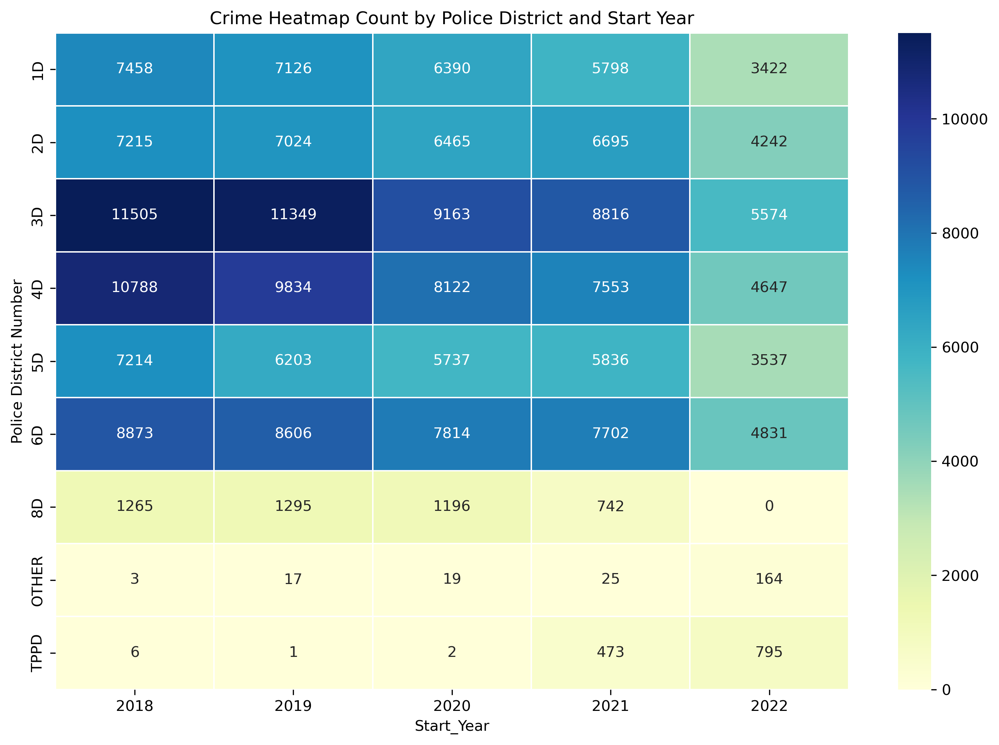

In [114]:
#2 Creating a heatmap using seaborn

heatmap_data = crime.pivot_table(index='Police District Number', columns='Start_Year', aggfunc='size', fill_value=0)


plt.figure(figsize=(12, 8), dpi = 300)
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='d', linewidths=.5)
plt.title('Crime Heatmap Count by Police District and Start Year')
plt.show()

# Question 1b

<Figure size 1200x1000 with 0 Axes>

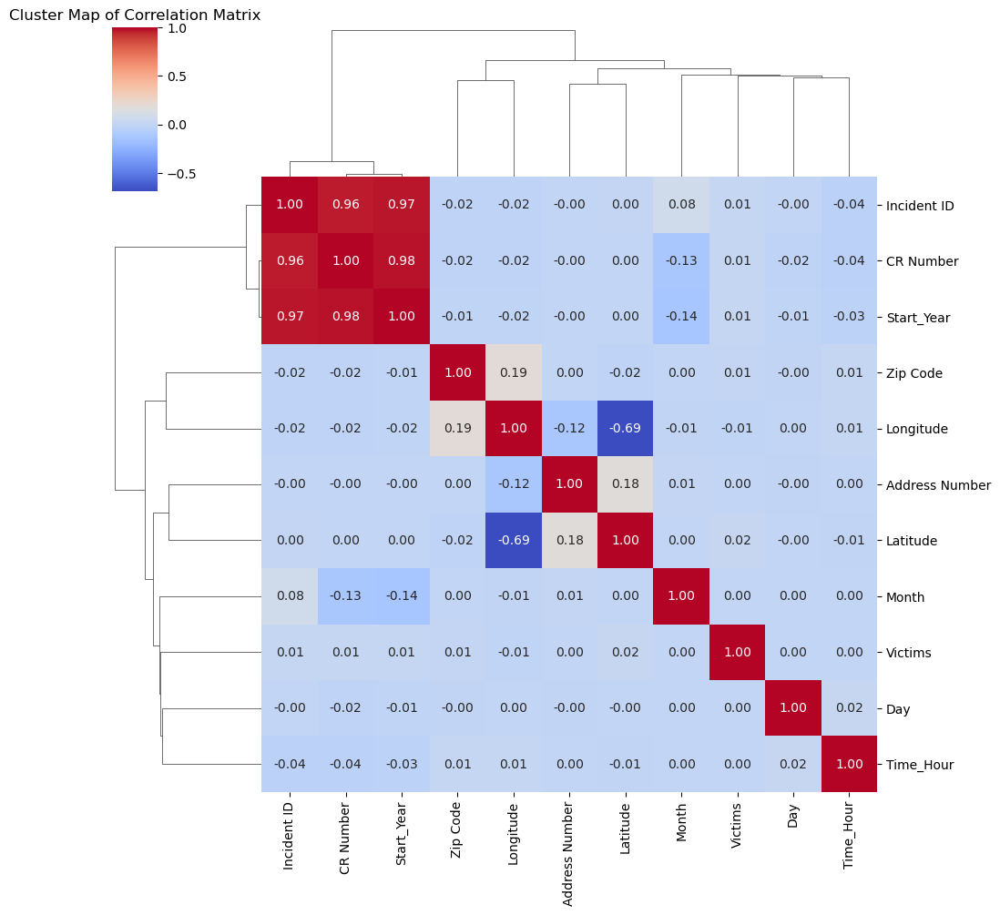

In [115]:
correlation_matrix = crime.corr()

plt.figure(figsize=(12, 10))
sns.clustermap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Cluster Map of Correlation Matrix')
plt.show()



## question 2a

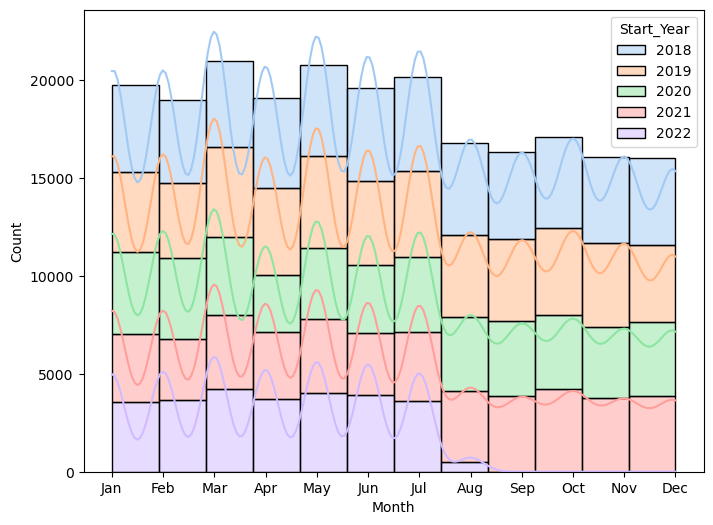

In [116]:
plt.figure(figsize=(8, 6))
sns.histplot(data = crime, x = crime['Month'], kde = True, bins=12, hue = crime['Start_Year'],palette = "pastel",  multiple="stack")
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.savefig('hist5.png', bbox_inches='tight')

# question 2b

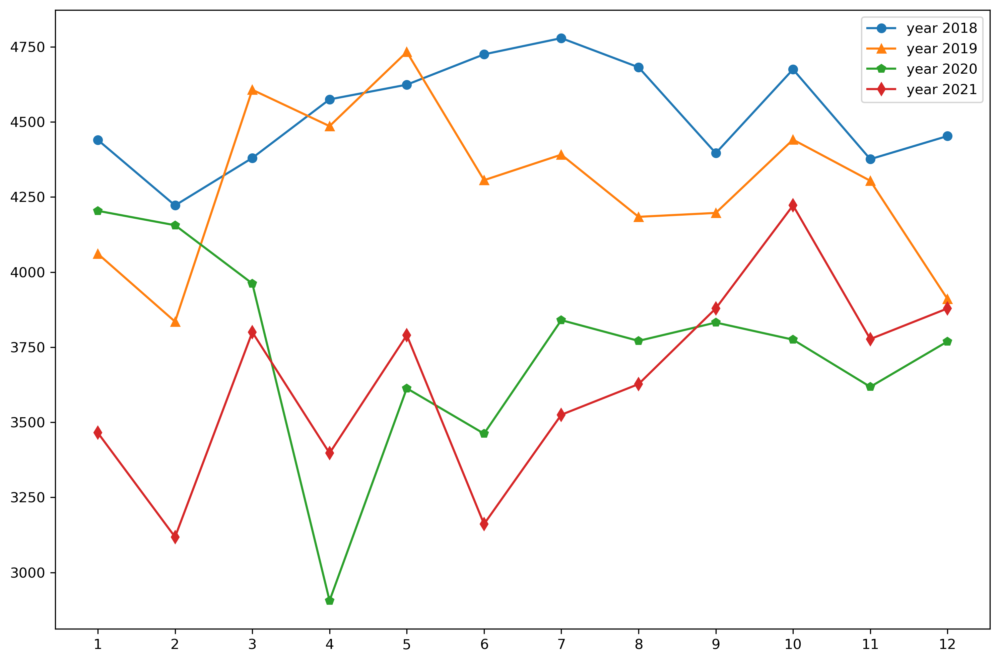

In [117]:
plt.figure(figsize = (12,8), dpi = 300)
plt.plot(sorted(list(crime_2018['Month'].unique())), y_2018.values(), marker = 'o', label = 'year 2018')
plt.plot(sorted(list(crime_2019['Month'].unique())), y_2019.values(), marker = '^', label = 'year 2019')
plt.plot(sorted(list(crime_2020['Month'].unique())), y_2020.values(), marker = 'p', label = 'year 2020')
plt.plot(sorted(list(crime_2021['Month'].unique())), y_2021.values(), marker = 'd', label = 'year 2021')
# plt.plot(sorted(list(crime_2018['Month'].unique())), y_2022.values(), marker = '>', label = 'year 2022')

plt.xticks(sorted(list(crime_2018['Month'].unique())))
plt.legend(loc = 'best')
plt.savefig('line4.png', bbox_inches='tight')
plt.show()

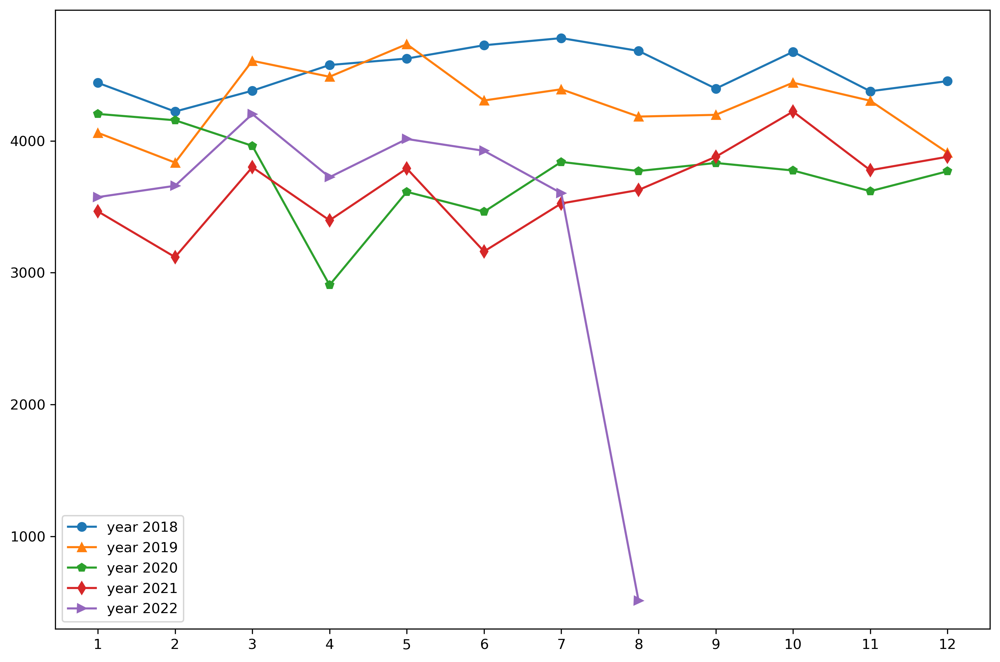

In [118]:
plt.figure(figsize = (12,8), dpi = 300)
plt.plot(sorted(list(crime_2018['Month'].unique())), y_2018.values(), marker = 'o', label = 'year 2018')
plt.plot(sorted(list(crime_2019['Month'].unique())), y_2019.values(), marker = '^', label = 'year 2019')
plt.plot(sorted(list(crime_2020['Month'].unique())), y_2020.values(), marker = 'p', label = 'year 2020')
plt.plot(sorted(list(crime_2021['Month'].unique())), y_2021.values(), marker = 'd', label = 'year 2021')
plt.plot(sorted(list(crime_2022['Month'].unique())), y_2022.values(), marker = '>', label = 'year 2022')

plt.xticks(sorted(list(crime_2018['Month'].unique())))
plt.legend(loc = 'best')
plt.show()

# question 3a

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/81637548.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x=crime_name1_counts.values, y=crime_name1_counts.index, ax=ax2, palette=colors_set3)


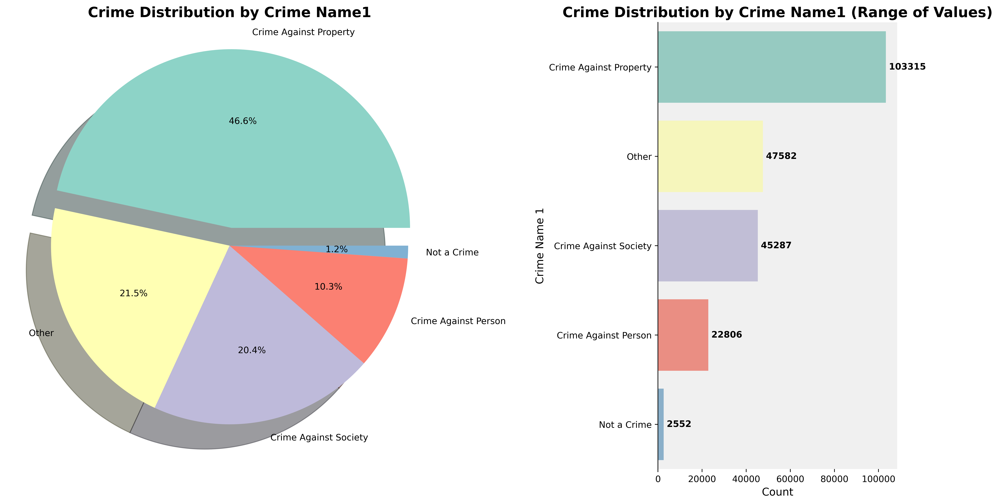

In [119]:
# Assuming crime_data5 is a DataFrame with 'Crime Name1' column
crime_name1_counts = crime['Crime Name1'].value_counts()

# Set up figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8), gridspec_kw={'width_ratios': [2, 1]}, dpi=500)

# Use a more colorful Set3 color palette
colors_set3 = sns.color_palette('Set3', n_colors=len(crime_name1_counts))

# Find the index of the largest value in crime_name1_counts
largest_index = crime_name1_counts.idxmax()

# Create an explode list with 0.1 for the largest slice (0.1 means pulling out)
explode = [0.1 if index == largest_index else 0 for index in crime_name1_counts.index]

# Pie chart with explode
ax1.pie(x=crime_name1_counts.values, labels=crime_name1_counts.index, autopct='%1.1f%%', colors=colors_set3, shadow=True, explode=explode)
ax1.set_title('Crime Distribution by Crime Name1', fontsize=16, fontweight='bold')

# Bar chart
barplot = sns.barplot(x=crime_name1_counts.values, y=crime_name1_counts.index, ax=ax2, palette=colors_set3)
ax2.set_title('Crime Distribution by Crime Name1 (Range of Values)', fontsize=16, fontweight='bold')
ax2.set_xlabel('Count', fontsize=12)
ax2.set_ylabel('Crime Name 1', fontsize=12)

# Add value counts on each bar
for index, value in enumerate(crime_name1_counts.values):
    barplot.text(value + 1, index, f' {value}', color='black', ha="left", va="center", fontweight='bold', fontsize=10)

# Increase space between subplots
plt.subplots_adjust(wspace=0.5)

# Remove spines
sns.despine(ax=ax2, top=True, right=True, bottom=True)

# Add a background color to the bar chart
ax2.set_facecolor('#f0f0f0')

plt.tight_layout()
plt.show()


# question 3b

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/492733378.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_chart = sns.countplot(x='Crime Name1', data=crime, order=crime['Crime Name1'].value_counts().index, palette="pastel", ax=ax0)


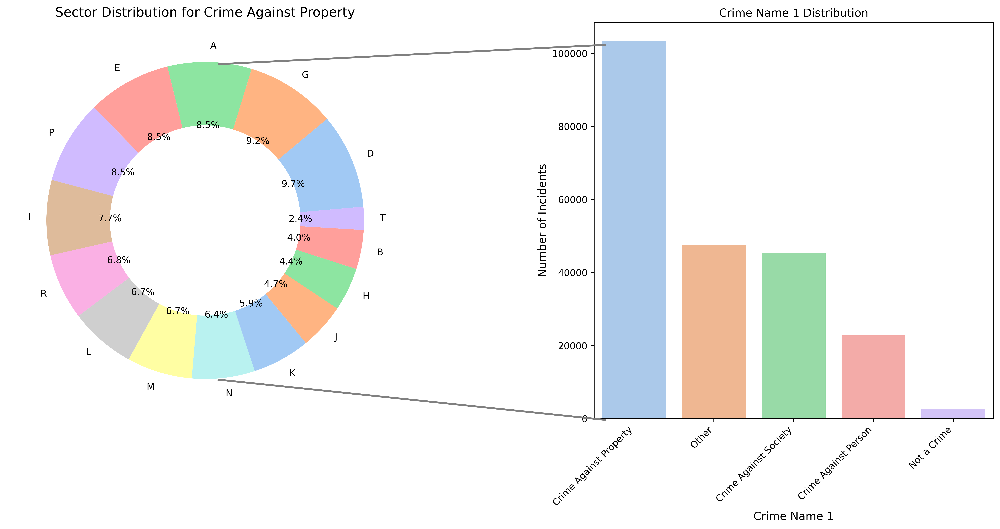

In [120]:
# Set a color palette for better aesthetics
sns.set_palette("husl")

# Create a grid with 1 row and 2 columns
fig = plt.figure(figsize=(18, 8), dpi = 500)
gs = GridSpec(1, 2, width_ratios=[1, 0.5])


# Bar chart for Crime Name 1
ax0 = plt.subplot(gs[1])
bar_chart = sns.countplot(x='Crime Name1', data=crime, order=crime['Crime Name1'].value_counts().index, palette="pastel", ax=ax0) 
ax0.set_title('Crime Name 1 Distribution')
ax0.set_xticks(range(len(crime['Crime Name1'].unique())))  # Set the x-ticks to the number of unique values
ax0.set_xticklabels(crime['Crime Name1'].value_counts().index, rotation=45, ha='right', fontsize=10)  # Set x-tick labels explicitly
ax0.set_xlabel('Crime Name 1', fontsize=12)
ax0.set_ylabel('Number of Incidents', fontsize=12)

# Find the crime with the highest frequency
highest_crime = crime['Crime Name1'].value_counts().idxmax()

# Filter the dataset for the crime with the highest frequency
highest_crime_data = crime[crime['Crime Name1'] == highest_crime]

# Count the occurrences of each sector
sector_counts = highest_crime_data['Sector'].value_counts()

# Create a DataFrame for the donut chart
sector_df = pd.DataFrame({'count': sector_counts.values}, index=sector_counts.index)

# Donut chart for Sector distribution of the highest crime
ax1 = plt.subplot(gs[0])
donut_chart = ax1.pie(sector_df['count'], labels=sector_df.index, autopct='%1.1f%%', startangle=5, wedgeprops=dict(width=0.4), colors=sns.color_palette('pastel'))
ax1.add_artist(plt.Circle((0, 0), 0.6, fc='white'))  # Add a white circle to create the donut effect
ax1.set_title(f'Sector Distribution for {highest_crime}', fontsize=14)

# Add fixed-size lines
line_coords1 = [(0.35, 0.67), (0.874, 0.91)]  # Adjust the coordinates as needed

line_coords2 = [(0.35, 0.67), (0.285, 0.21)]  # Adjust the coordinates as needed

line1 = plt.Line2D(line_coords1[0], line_coords1[1], color='grey', linewidth=2, transform=fig.transFigure)
line2 = plt.Line2D(line_coords2[0], line_coords2[1], color='grey', linewidth=2, transform=fig.transFigure)

fig.lines.append(line1)
fig.lines.append(line2)

plt.tight_layout()
plt.show()


# Question 4a

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

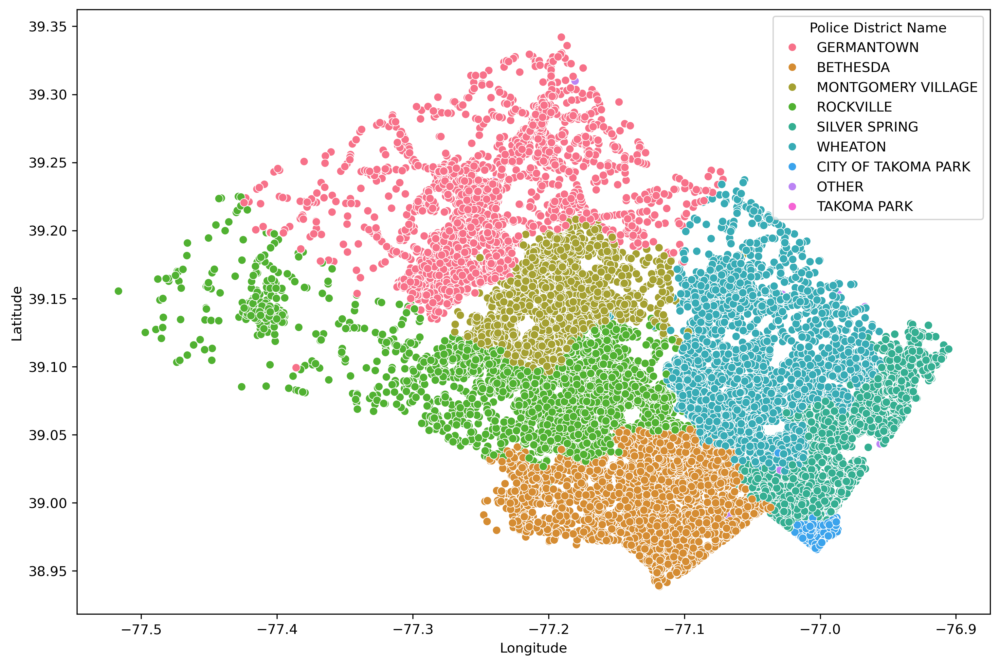

In [121]:
plt.figure(figsize=(12,8), dpi=300)
sns.scatterplot(data=crime, y = crime.Latitude, x = crime.Longitude, hue='Police District Name')

# question 4b

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 2400x1600 with 0 Axes>

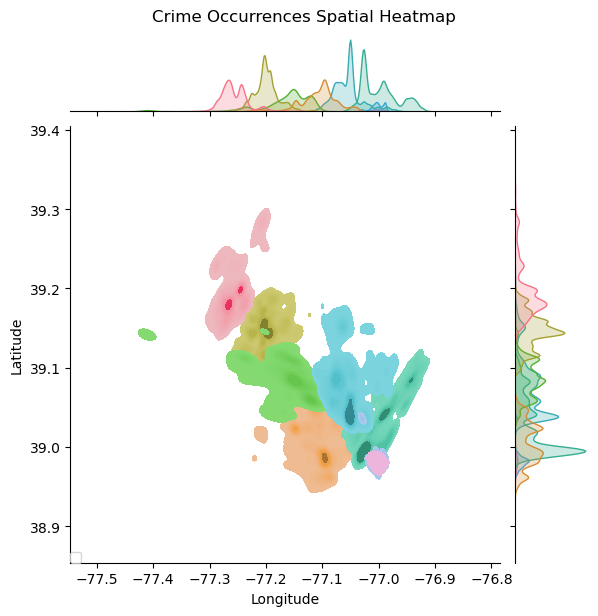

In [122]:
plt.figure(figsize=(12,8), dpi = 200)
sns.jointplot(x=crime['Longitude'], y=crime['Latitude'], hue = crime['Police District Name'], kind='kde', fill=True)
plt.suptitle('Crime Occurrences Spatial Heatmap', y=1.02)
plt.legend(loc='lower left', borderaxespad=0)
plt.show()

# question 5a

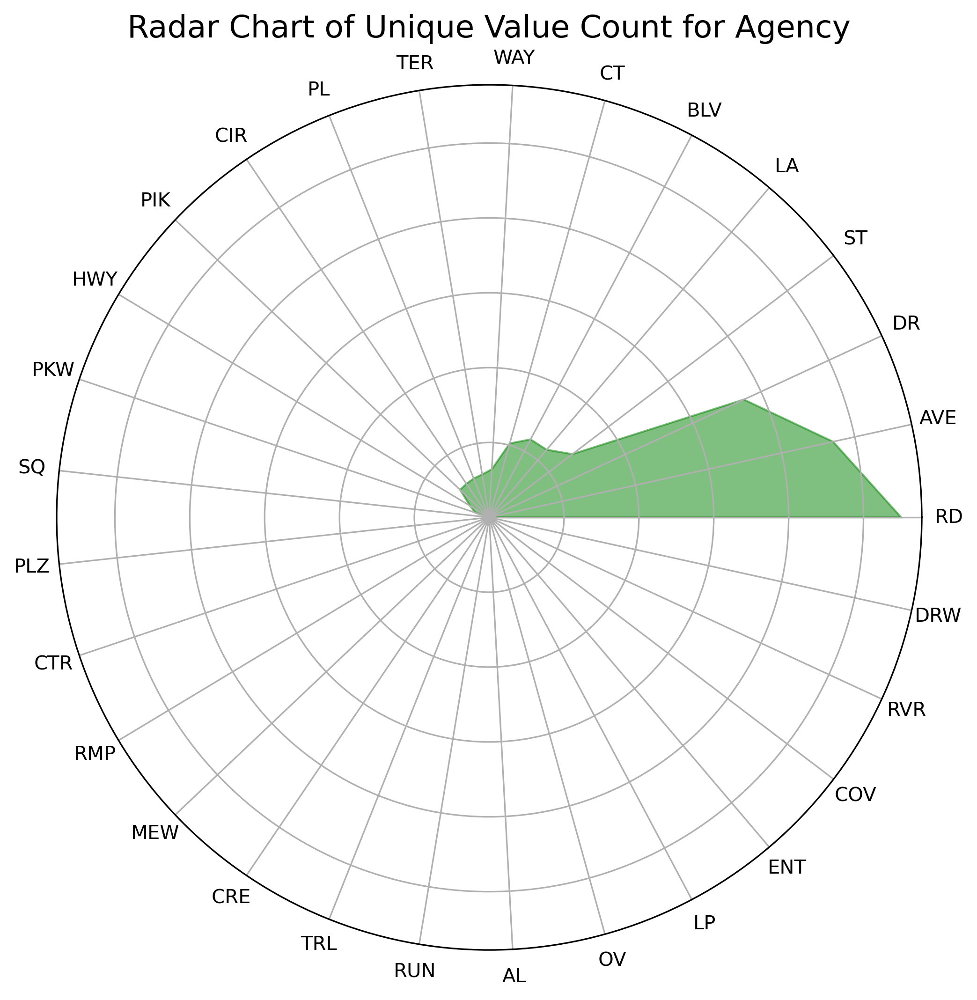

In [123]:
# Count the unique values in the 'Agency' column
agency_counts = crime['Street Type'].value_counts()

# Create a DataFrame with the counts
agency_counts_df = pd.DataFrame({'Street Type': agency_counts.index, 'Count': agency_counts.values})

# Number of variables
num_vars = len(agency_counts_df)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "close the loop" and append the start point
values = agency_counts_df['Count'].tolist()
values += values[:1]
angles += angles[:1]

# Plot
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(polar=True), dpi = 300)
ax.fill(angles, values, color='green', alpha=0.5)
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(agency_counts_df['Street Type'])

plt.title('Radar Chart of Unique Value Count for Agency', size=16)


plt.show()

# question 5b

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/1993748988.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y="Street Type", data=crime, order=top_values.index, palette='rocket')


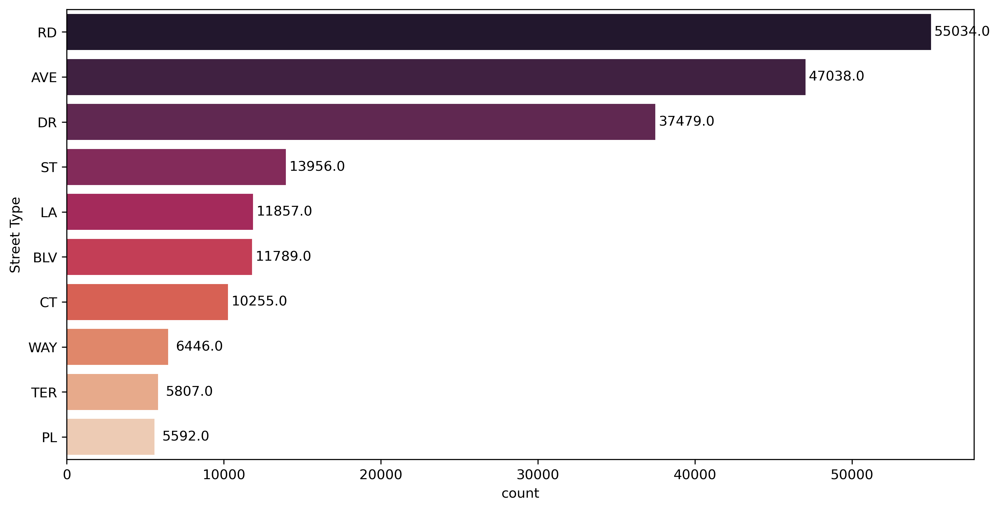

In [124]:
plt.figure(figsize=(12,6), dpi = 300)
# Get the top 10 values and their counts
top_values = crime['Street Type'].value_counts().head(10)

# Create a horizontal count plot for the top 10 values
sns.countplot(y="Street Type", data=crime, order=top_values.index, palette='rocket')

# Display count values on the right of each bar
ax = plt.gca()
for p in ax.patches:
    ax.text(p.get_width() + 2000, p.get_y() + p.get_height() / 2, f'{p.get_width()}', ha='center', va='center')

plt.show()

## Question 6a
## By the look of the above code cell, we do get an idea that the crime rate has decreased over years in the state of Maryland. With a countplot over the years will give us a much better visualisation that there is a decrease in the crime rate through the selected years from 2018-2022

<AxesSubplot:xlabel='Start_Year', ylabel='count'>

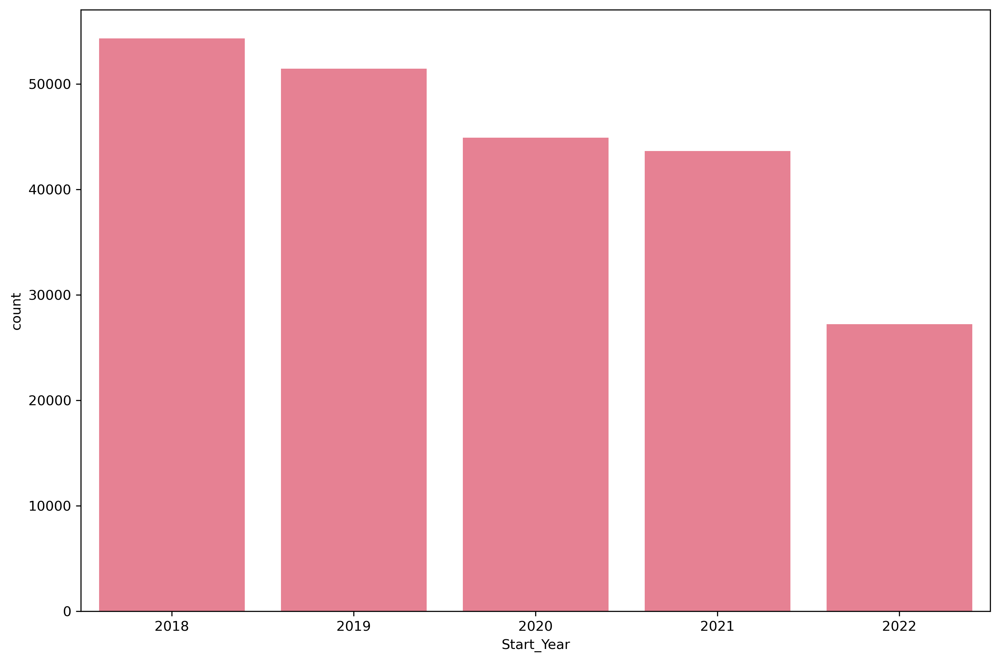

In [125]:
plt.figure(figsize=(12,8), dpi = 300)
sns.countplot(data = crime, x = crime['Start_Year'])

# question 6b

### the overall crime rate has decreased, but we want to see more deeper analysis of what type of crimes have gotten lesser over the years. With a countplot and seeting the hue to the subset of the types of crimes, which is 'Crime Name1' column in the dataset. We can see the plot below that describes the number of crimes for differetn category of crimes

### The plot below shows a more deeper view into the crime rate, which depicts that the crime against society has been decresing, because of the pandemic in the recent years has made many of us home bound and there was a decrease in the crime against society. But crime against property has been at a all time high in 2021 with a visible increase from 2018, again because of the pandemic that has led rise to robbery, theft and other types of crime against the property.

<AxesSubplot:xlabel='Start_Year', ylabel='count'>

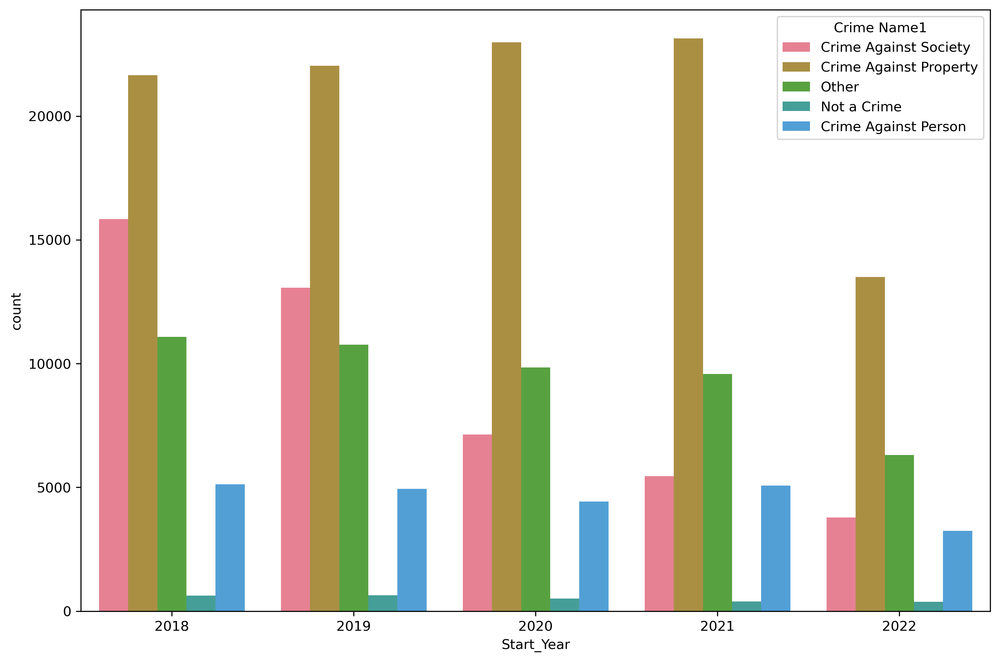

In [126]:
plt.figure(figsize=(12,8), dpi = 300)
sns.countplot(data = crime, x = crime['Start_Year'], hue=crime['Crime Name1'])

# question 7a

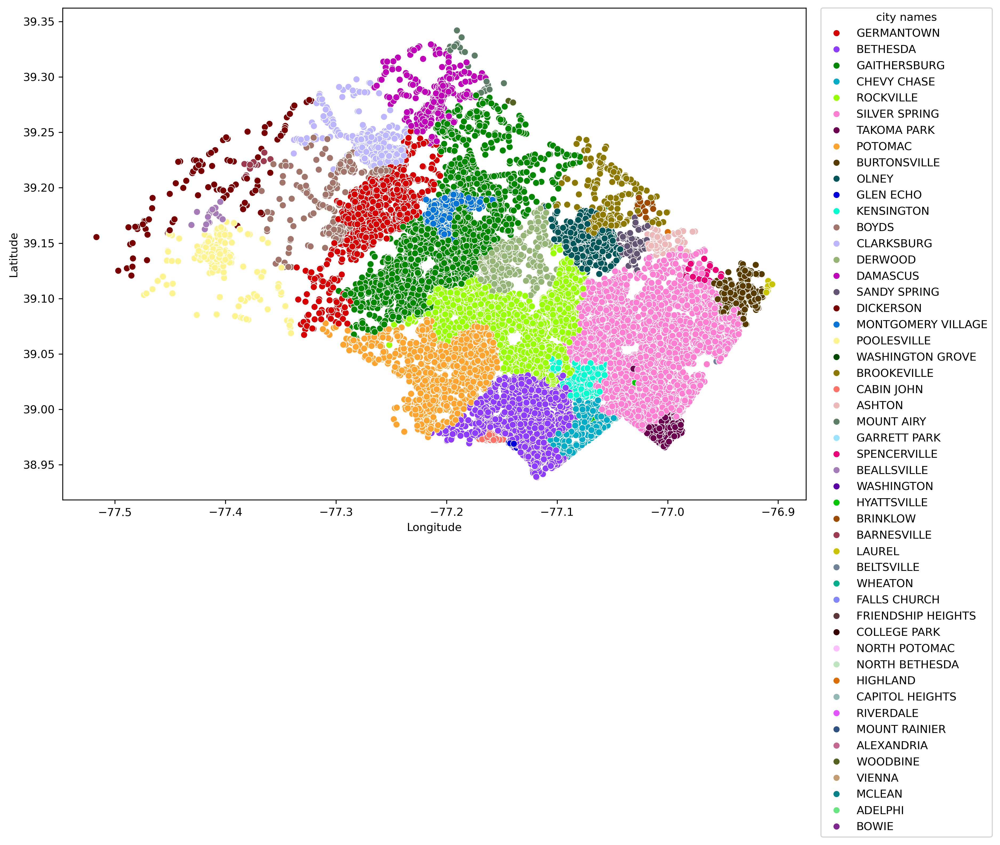

In [127]:
plt.figure(figsize=(12,8), dpi = 300)
#sns.rugplot(data = crime, x = crime['Longitude'], y = crime['Latitude'], hue = crime['City'], palette=sns.color_palette("bright", 50))
palette = sns.color_palette(cc.glasbey, n_colors=50)
sns.scatterplot(data = crime, x = crime['Longitude'], y = crime['Latitude'], hue = crime['City'], palette=palette)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title = 'city names')

# question 7b

In [128]:
pool_crime = crime.loc[crime['City'] == 'POOLESVILLE']
potomac_crime = crime.loc[crime['City'] == 'POTOMAC']
damascus_crime = crime.loc[crime['City'] == 'DAMASCUS']
silver_crime = crime.loc[crime['City'] == 'SILVER SPRING']

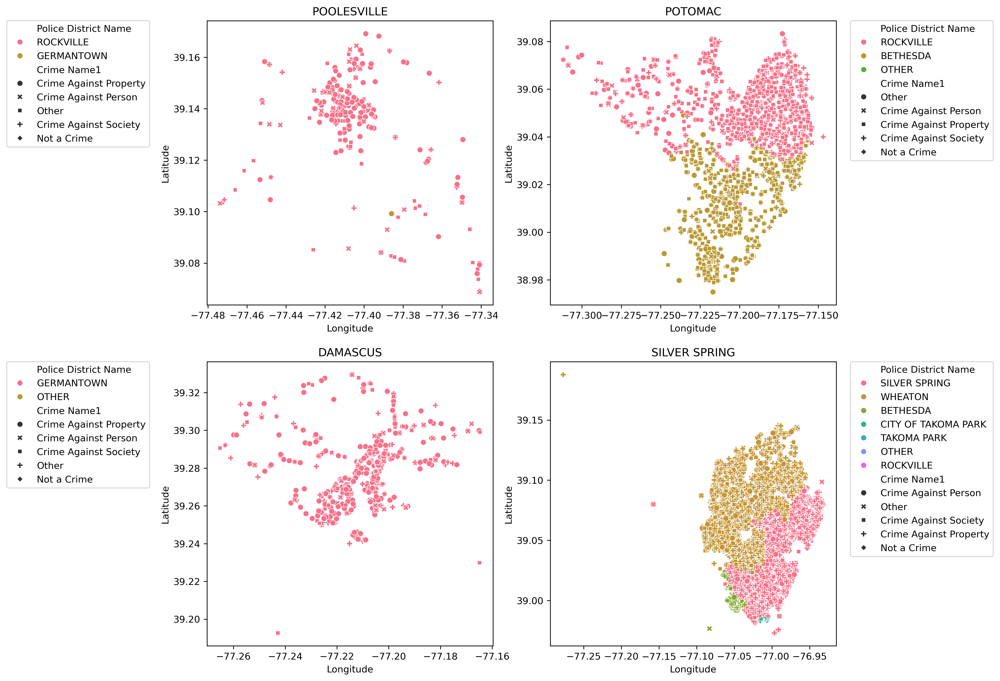

In [129]:
plt.figure(figsize=(12,12), dpi = 300)

# handles, labels = plt.gca().get_legend_handles_labels()
# plt.legend(handles, labels, loc='upper center')

plt.subplot(2,2,1)
plt.title('POOLESVILLE')
sns.scatterplot(data = pool_crime, x = pool_crime['Longitude'], y = pool_crime['Latitude'], hue = pool_crime['Police District Name'], style = pool_crime['Crime Name1'])
plt.legend(bbox_to_anchor=(-0.7, 1), loc='upper left', borderaxespad=0)

plt.subplot(2,2,2)
plt.title('POTOMAC')
sns.scatterplot(data = potomac_crime, x = potomac_crime['Longitude'], y = potomac_crime['Latitude'], hue = potomac_crime['Police District Name'], style = potomac_crime['Crime Name1'])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

plt.subplot(2,2,3)
plt.title('DAMASCUS')
sns.scatterplot(data = damascus_crime, x = damascus_crime['Longitude'], y = damascus_crime['Latitude'], hue = damascus_crime['Police District Name'], style = damascus_crime['Crime Name1'])
plt.legend(bbox_to_anchor=(-0.70, 1), loc='upper left', borderaxespad=0)

plt.subplot(2,2,4)
plt.title('SILVER SPRING')
sns.scatterplot(data = silver_crime, x = silver_crime['Longitude'], y = silver_crime['Latitude'], hue = silver_crime['Police District Name'], style = silver_crime['Crime Name1'])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

plt.show()

# question 8a

<AxesSubplot:xlabel='Month', ylabel='count'>

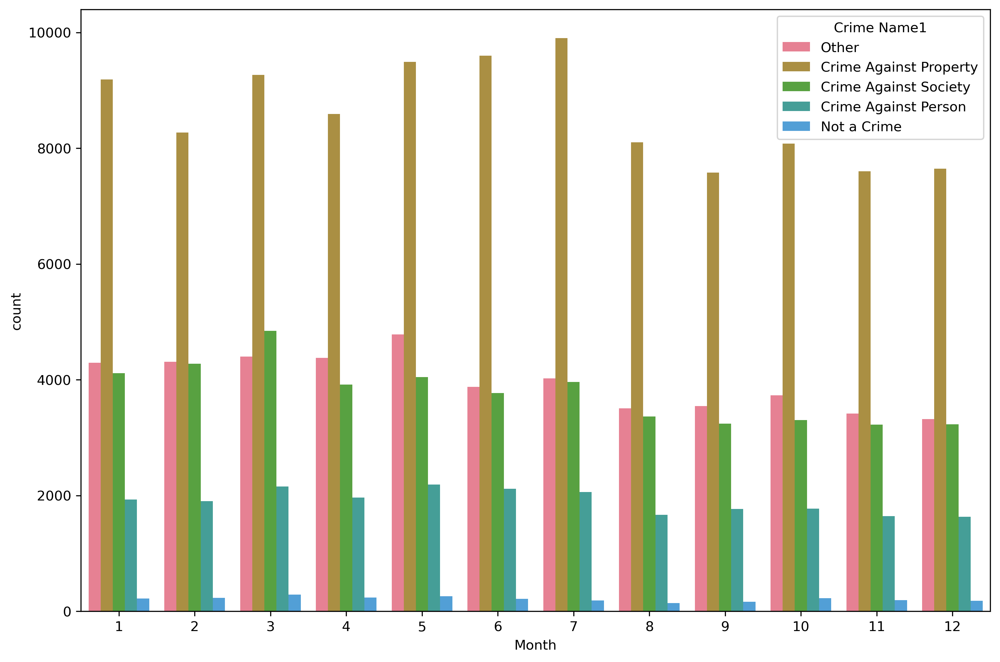

In [130]:
plt.figure(figsize=(12,8), dpi = 300)
sns.countplot(data = crime, x = crime['Month'], hue = crime['Crime Name1'])

# question 8b

<Figure size 1600x800 with 0 Axes>

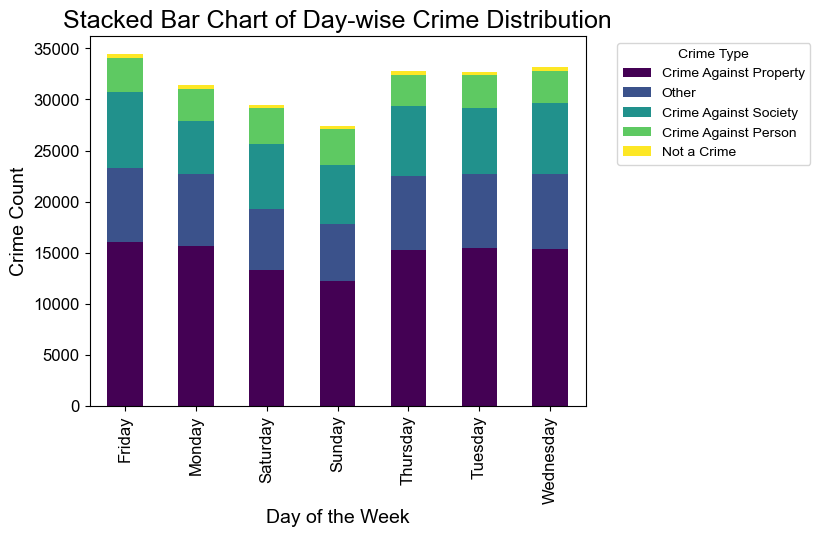

In [131]:
# Color Palette
custom_palette = sns.color_palette("husl", n_colors=len(crime['Crime Name1'].unique()))

# Stacked bar chart for crime types by day of the week
crime_day_counts = crime.groupby(['day_name', 'Crime Name1']).size().unstack().fillna(0)
crime_day_counts = crime_day_counts[crime['Crime Name1'].value_counts().index]  # Reorder columns

plt.figure(figsize=(16, 8))
crime_day_counts.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Stacked Bar Chart of Day-wise Crime Distribution', fontsize=18)
plt.xlabel('Day of the Week', fontsize=14)
plt.ylabel('Crime Count', fontsize=14)
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')


sns.set(style="whitegrid")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()

# question 9a

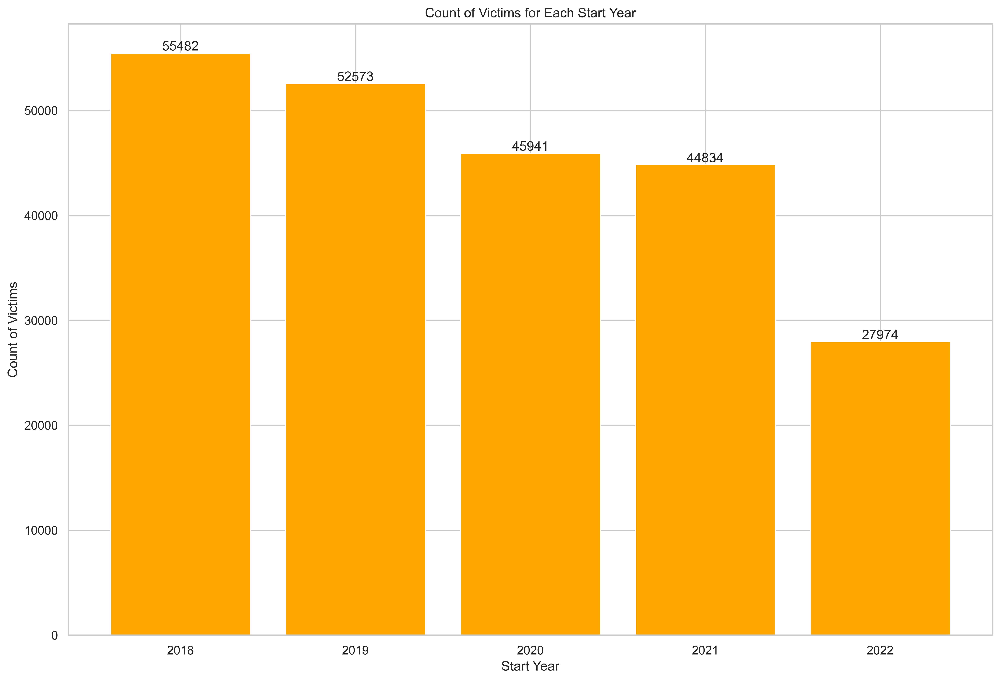

In [132]:
fig, ax = plt.subplots(figsize=(15, 10), dpi=500)

# Assuming 'Start_Year' and 'Victims' are columns in your 'crime_data5' DataFrame
victims_count_by_year = crime.groupby('Start_Year')['Victims'].sum()
df_victims_count = victims_count_by_year.reset_index()

# Plotting
bars = ax.bar(df_victims_count['Start_Year'], df_victims_count['Victims'], color='orange')

plt.xlabel('Start Year')
plt.ylabel('Count of Victims')
plt.title('Count of Victims for Each Start Year')

# Add labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 1), ha='center', va='bottom')

plt.show()

# question 9b

In [133]:
crime_2018 = crime[crime['Start_Year'] == 2018]

Text(0.5, 1.0, 'Plot of number of crimes with crime name and hue set to time of the day')

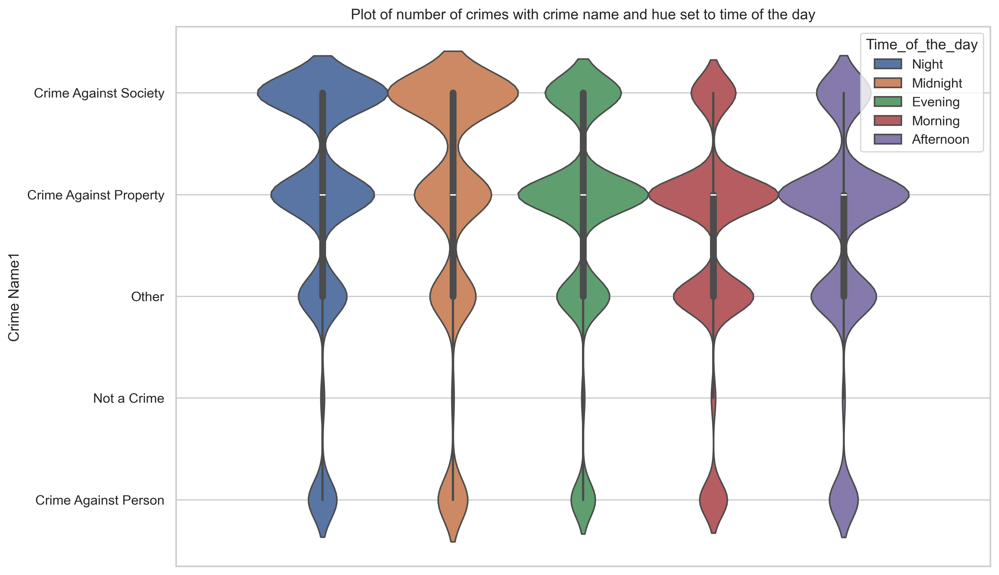

In [134]:
plt.figure(figsize=(12,8), dpi=300)
sns.violinplot(data = crime_2018, y = crime_2018['Crime Name1'], hue = crime_2018['Time_of_the_day'])
plt.title('Plot of number of crimes with crime name and hue set to time of the day')

# question 10

/var/folders/fr/9nj2qxhx4_bf25kdhplqpxxm0000gn/T/ipykernel_1262/3283741658.py:16: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  outer_circle = plt.Circle((0, 0), outer_circle_radius, color='white', edgecolor='black', linewidth=2, fill=False)


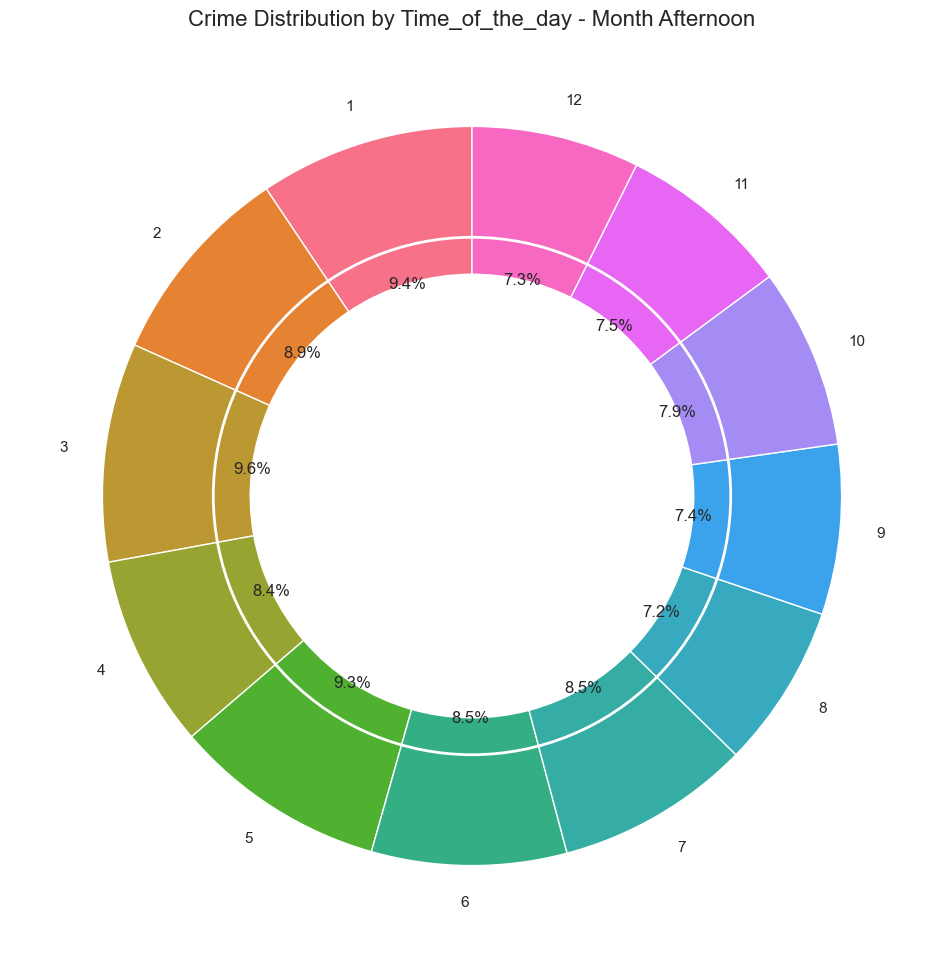

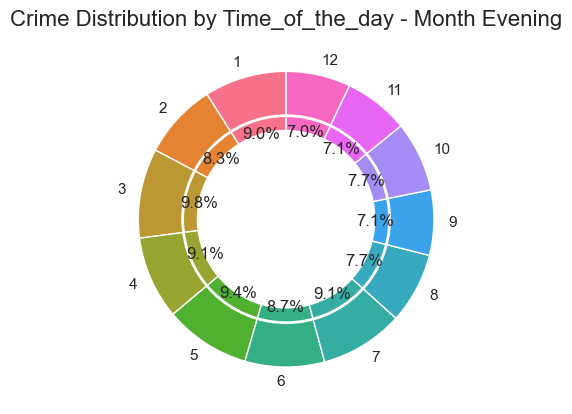

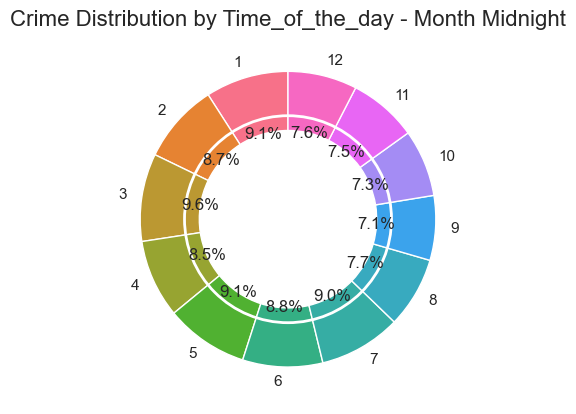

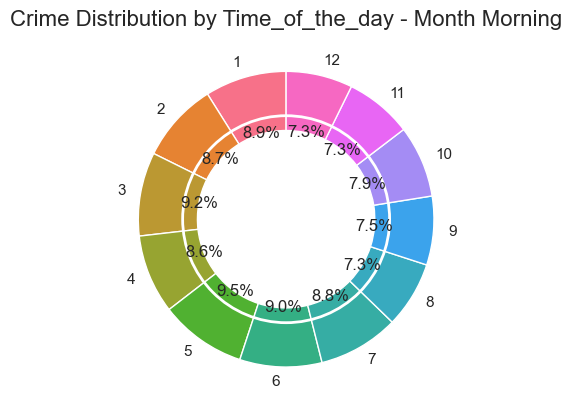

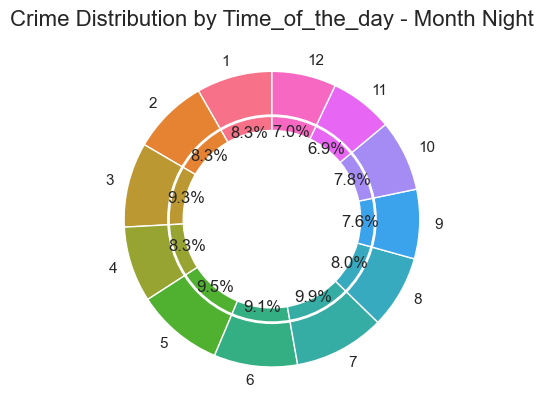

In [135]:
inner_column = 'Time_of_the_day'
outer_column = 'Month'

crime_counts = crime.groupby([inner_column, outer_column]).size().unstack().fillna(0)

inner_palette = sns.color_palette("husl", n_colors=len(crime_counts.columns))
outer_palette = sns.color_palette("Set3", n_colors=len(crime_counts.index))

plt.figure(figsize=(12, 12))
outer_circle_radius = 0.7  

for outer_index, (outer_label, outer_row) in enumerate(crime_counts.iterrows()):
    plt.pie(outer_row, labels=outer_row.index, autopct='%1.1f%%', startangle=90,
            wedgeprops=dict(width=0.4, edgecolor='w'), radius=1.0, colors=inner_palette)

    outer_circle = plt.Circle((0, 0), outer_circle_radius, color='white', edgecolor='black', linewidth=2, fill=False)
    plt.gca().add_artist(outer_circle)

    plt.title(f'Crime Distribution by {inner_column} - {outer_column} {outer_label}', fontsize=16)
    plt.show()

# question 11a

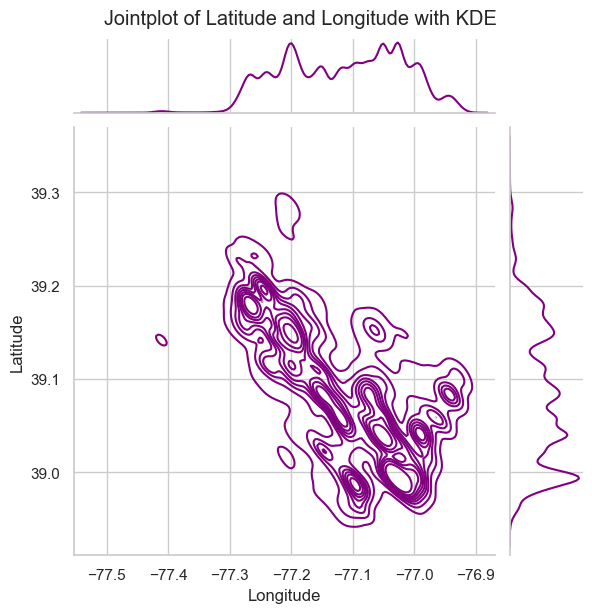

In [136]:
sns.jointplot(x='Longitude', y='Latitude', data=crime, kind='kde', color='purple')
plt.suptitle('Jointplot of Latitude and Longitude with KDE', y=1.02)
plt.show()

# question 11b

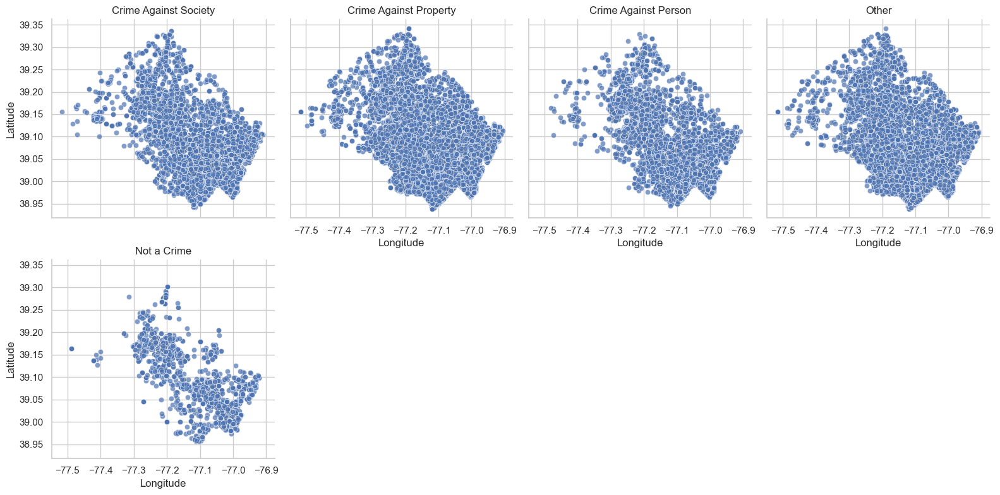

In [137]:
g = sns.FacetGrid(crime, col='Crime Name1', col_wrap=4, height=4)
g.map(sns.scatterplot, 'Longitude', 'Latitude', alpha=0.7)
g.set_axis_labels('Longitude', 'Latitude')
g.set_titles(col_template='{col_name}')
plt.show()

# question 12a

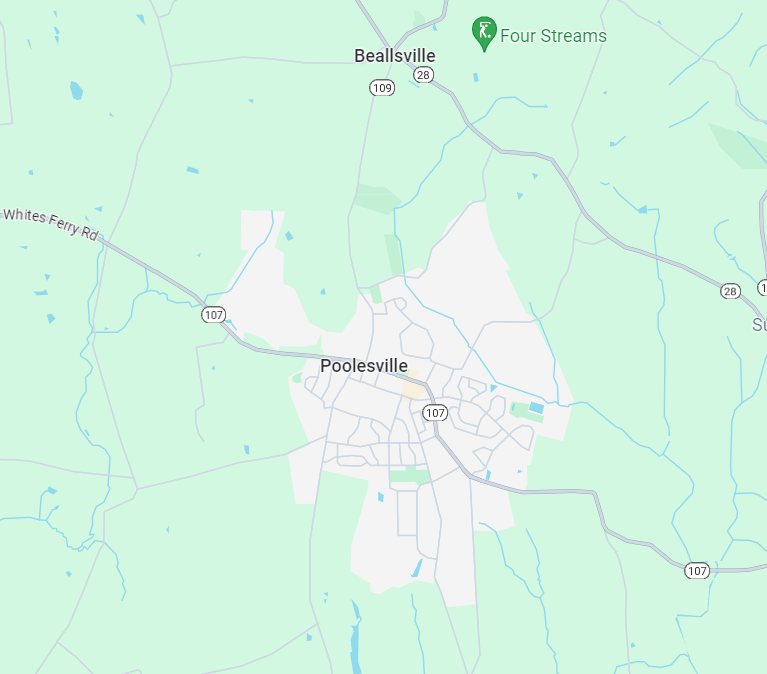

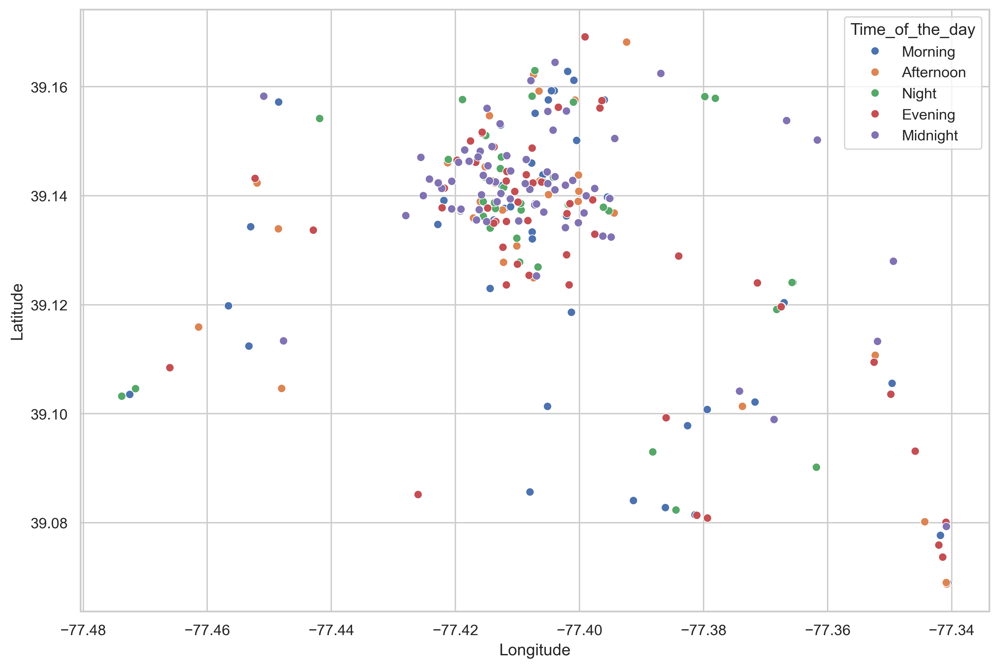

In [138]:
pool_crime = crime[crime['City'] == 'POOLESVILLE']
desired_order = ['Morning', 'Afternoon', 'Night', 'Evening', 'Midnight']
plt.figure(figsize=(12, 8), dpi=300)
sns.scatterplot(
    data=pool_crime.sort_values('Time_of_the_day', key=np.vectorize(desired_order.index)),
    x='Longitude',
    y='Latitude',
    hue='Time_of_the_day',
    hue_order=desired_order,
)

# Show the plot
plt.show()

# question 12b

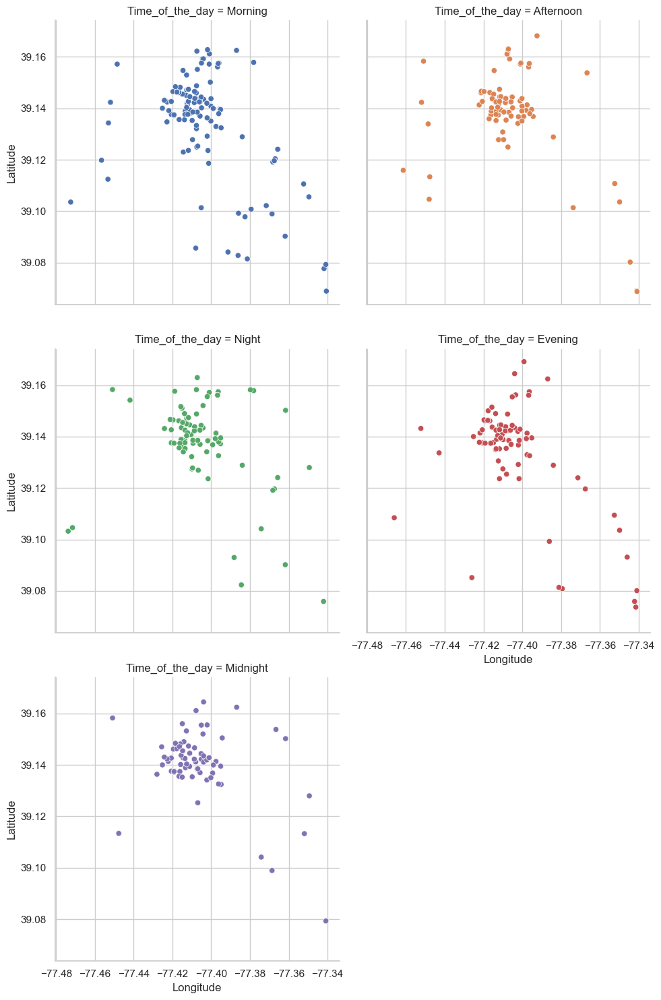

In [139]:
pool_crime = crime[crime['City'] == 'POOLESVILLE']

g = sns.relplot(
    data=pool_crime,
    x="Longitude",
    y="Latitude",
    hue='Police District Name',
    col="Time_of_the_day",
    col_wrap=2
)

num_plots = len(g.axes.flatten())

colors = sns.color_palette(n_colors=num_plots)

for i, ax in enumerate(g.axes.flat):
    current_time = pool_crime['Time_of_the_day'].unique()[i]
    current_data = pool_crime[pool_crime['Time_of_the_day'] == current_time]
    sns.scatterplot(
        data=current_data,
        x='Longitude',
        y='Latitude',
        hue='Police District Name',
        palette={dist: colors[i] for dist in current_data['Police District Name'].unique()},
        ax=ax
    )
    ax.get_legend().set_visible(False)

g._legend.remove()
# Show the plot
plt.show()

# question 13

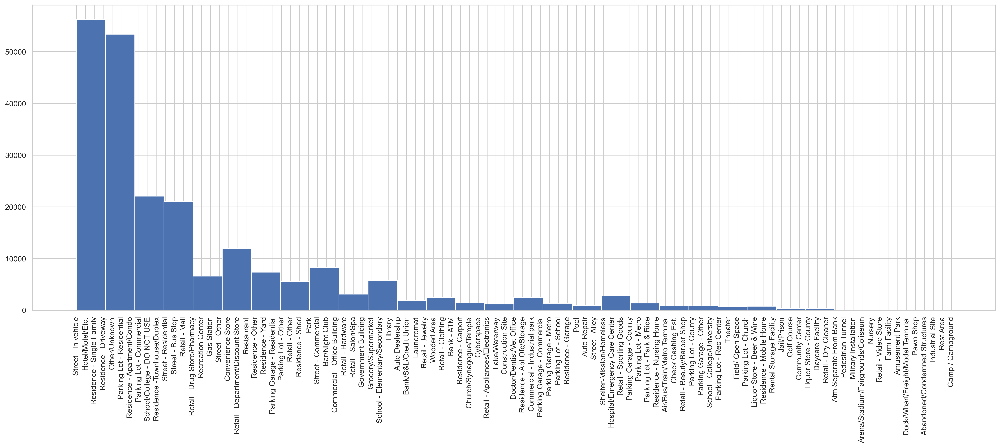

In [140]:
plt.figure(figsize=(25,8), dpi = 300)
plt.hist(crime['Place'], bins = 30)# round(len(crime['Place'])**(1/2)))
plt.xticks(rotation = 90)
plt.show()

# question 14

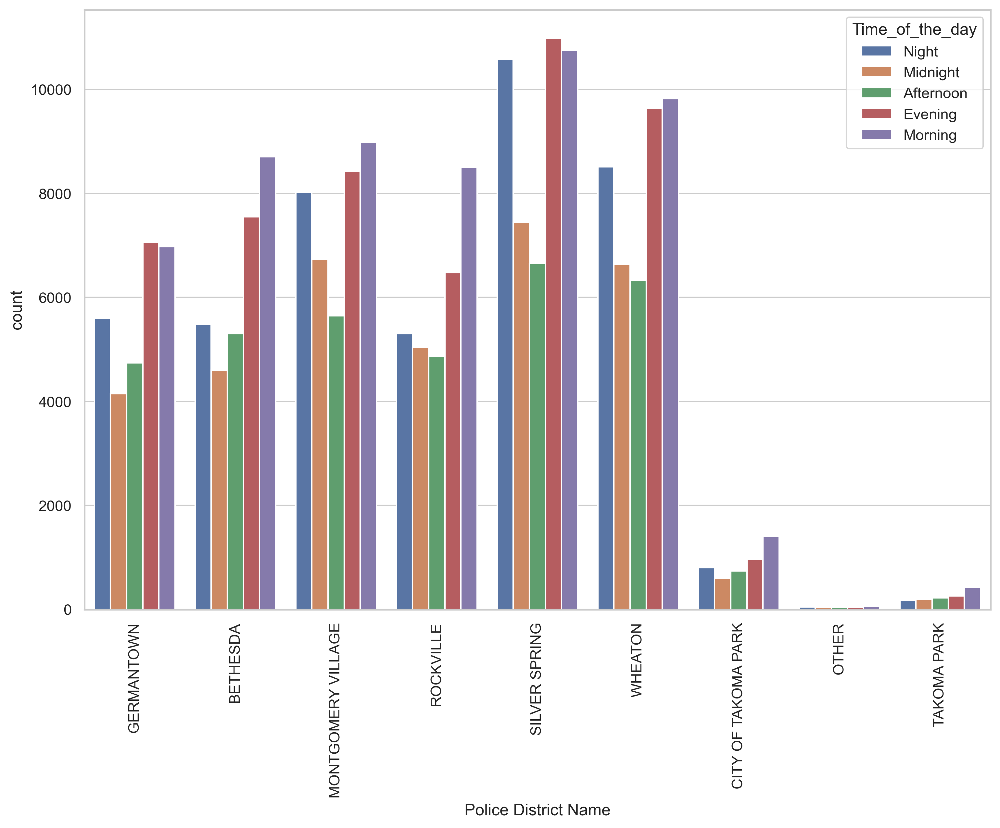

In [141]:
plt.figure(figsize=(12,8), dpi = 300)
sns.countplot(x = crime['Police District Name'], hue = crime['Time_of_the_day'])

plt.xticks(rotation = 90)
plt.show()

# question 15a

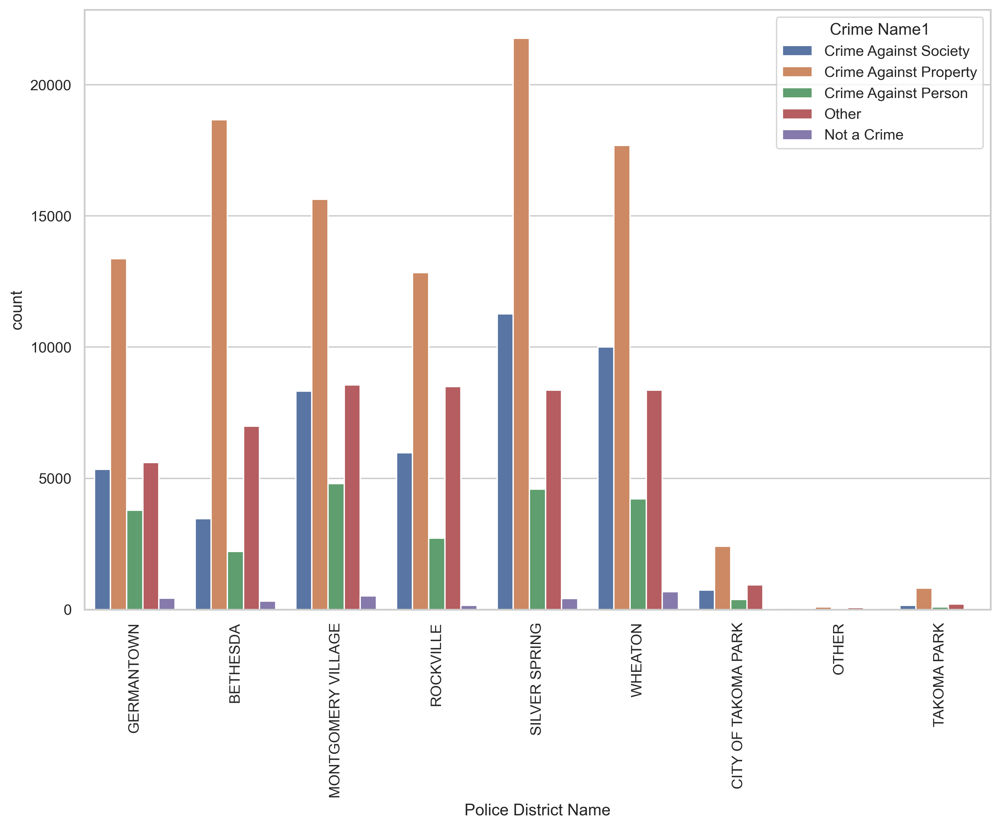

In [142]:
plt.figure(figsize=(12,8), dpi = 300)
sns.countplot(x = crime['Police District Name'], hue = crime['Crime Name1'])

plt.xticks(rotation = 90)
plt.show()

# question 15b

In [143]:
silver_crime = crime[crime['Police District Name'] == 'SILVER SPRING']

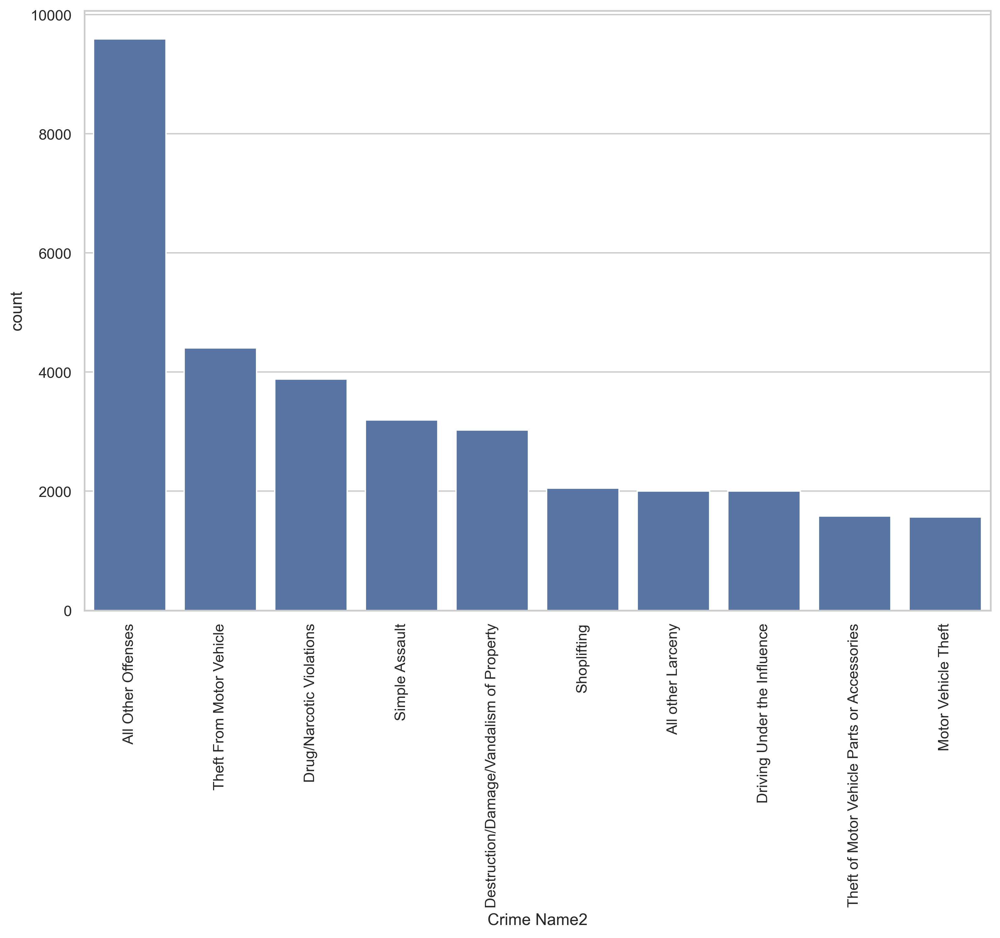

In [144]:
plt.figure(figsize=(12,8), dpi = 300)
x = silver_crime['Crime Name2'].value_counts().head(10)
sns.countplot(data = silver_crime, x = silver_crime['Crime Name2'], order = x.index)
plt.xticks(rotation = 90)
plt.show()

In [145]:
# # Example data
# data = silver_crime

# # Create a swarm plot
# sns.swarmplot(x=silver_crime['Crime Name2'], data=data,hu)
# plt.show()

In [146]:
silver_crime_all = silver_crime[silver_crime['Crime Name2'] == 'All Other Offenses']

In [147]:
silver_crime_all['Crime Name3'].value_counts()

POLICE INFORMATION                                    2353
MENTAL ILLNESS - EMERGENCY PETITION                   1980
LOST PROPERTY                                         1482
SUDDEN DEATH                                           728
MISSING PERSON                                         652
                                                      ... 
SMUGGLING - CONTRABAND                                   1
OBSTRUCT POLICE - EVIDENCE - DESTROYING                  1
ESCAPE - FLIGHT TO AVOID                                 1
INVASION PRIVACY (DESCRIBE OFFENSE)                      1
FAMILY OFFENSE - CONTRIBUTING TO THE DELINQUENCY O       1
Name: Crime Name3, Length: 65, dtype: int64

In [148]:
dict1 = dict(silver_crime_all['Crime Name3'].value_counts())

In [149]:
silver_crime_all['Crime Name3'].value_counts().head()

POLICE INFORMATION                     2353
MENTAL ILLNESS - EMERGENCY PETITION    1980
LOST PROPERTY                          1482
SUDDEN DEATH                            728
MISSING PERSON                          652
Name: Crime Name3, dtype: int64

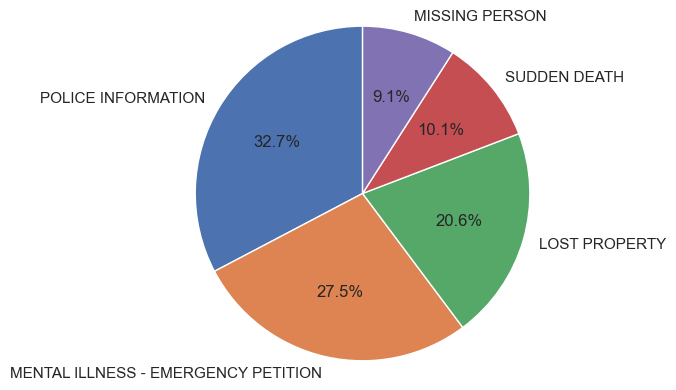

In [150]:
import matplotlib.pyplot as plt

# Sample data
labels = dict1.keys()
values = dict1.values()

# Sort the data in descending order
data = list(zip(labels, values))
data.sort(key=lambda x: x[1], reverse=True)

# Extract the top 5 values and labels
top_labels = [item[0] for item in data[:5]]
top_values = [item[1] for item in data[:5]]

# Create a pie chart for the top 5 values
plt.pie(top_values, labels=top_labels, autopct='%1.1f%%', startangle=90)

# Equal aspect ratio ensures that pie is drawn as a circle.
plt.axis('equal')

# Display the pie chart
plt.show()